# Modélisation 

In [ ]:
# Import librairies
import pandas as pd
import numpy as np
import seaborn as sns
import pingouin as pg
import io
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

In [ ]:
# If working in google colab
# Import file
from google.colab import files
uploaded = files.upload()

Saving data_final.csv to data_final.csv


In [ ]:
# If working in google colab
# Read file
RFM = pd.read_csv(io.BytesIO(uploaded['data_final.csv']))

In [ ]:
# If working in Jupyter
# Read file
RFM = pd.read_csv('data_final.csv')

In [ ]:
# Work on a copy
df = RFM.copy()

In [ ]:
df.shape

(93627, 8)

In [ ]:
df.dropna(how='any', inplace=True)

In [ ]:
df.shape

(93627, 8)

In [ ]:
df.drop(columns=['Unnamed: 0'],
        inplace=True)
df.sample(5)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
86500,ec4ea66c2d786c77be7966902b3f8290,28,46.71,1.0,1,46.71,0.295654
23173,3f063d0a00c390265a45f0055472e72d,337,121.19,1.0,1,121.19,0.174849
93491,ff9c04f464ea62ad7787a0218336b942,156,91.38,1.5,2,45.69,0.512366
26951,49788b90e1ec6ef648fecca8bda623d8,199,406.58,1.0,1,406.58,0.028481
41772,71e3779e4ed716505c58323df01a2dda,321,31.75,1.0,1,31.75,0.373228


In [ ]:
df.dtypes

ID_Client                       object
Jours_Depuis_Dernier_Achat       int64
Achats_Totaux                  float64
Nb_Séquences_Paiement_Moyen    float64
Nb_Categories_Produits           int64
Panier_Moyen                   float64
Ratio_Frais_Panier_Moyen       float64
dtype: object

## Transformation au log et standardisation

In [ ]:
df.columns

Index(['ID_Client', 'Jours_Depuis_Dernier_Achat', 'Achats_Totaux',
       'Nb_Séquences_Paiement_Moyen', 'Nb_Categories_Produits', 'Panier_Moyen',
       'Ratio_Frais_Panier_Moyen'],
      dtype='object')

In [ ]:
"""We test the normality of the variables"""

data = df
pg.normality(data, method='normaltest')

,W,pval,normal
Jours_Depuis_Dernier_Achat,6847.359994,0.0,False
Achats_Totaux,329086.355851,0.0,False
Nb_Séquences_Paiement_Moyen,221745.002119,0.0,False
Nb_Categories_Produits,187465.454792,0.0,False
Panier_Moyen,145271.557770,0.0,False
Ratio_Frais_Panier_Moyen,104304.674875,0.0,False


In [ ]:
"""We apply a log transformation to the variables.

If the variables don't have a normal distribution,
we apply a log transformation.
If the variables have negative and zero values,
we add 1 to have a valid log transformation.
"""


def transformation_log(df):

    global Log_Tfd_Data

    def handle_neg_n_zero(num):
        if num == 0:
            return num+1
        else:
            return num
    # Apply handle_neg_n_zero function to Recency and Monetary columns
    df['Jours_Depuis_Dernier_Achat'] = [handle_neg_n_zero(x) for x in df.Jours_Depuis_Dernier_Achat]
    df['Achats_Totaux'] = [handle_neg_n_zero(x) for x in df.Achats_Totaux]
    df['Panier_Moyen'] = [handle_neg_n_zero(x) for x in df.Panier_Moyen]
    df['Nb_Séquences_Paiement_Moyen'] = [handle_neg_n_zero(x) for x in df.Nb_Séquences_Paiement_Moyen]
    df['Nb_Categories_Produits'] = [handle_neg_n_zero(x) for x in df.Nb_Categories_Produits]
    df['Ratio_Frais_Panier_Moyen'] = [handle_neg_n_zero(x) for x in df.Ratio_Frais_Panier_Moyen]

    # Perform Log transformation to bring data into normal or near normal distribution
    Log_Tfd_Data = df[[
                       'Jours_Depuis_Dernier_Achat', 'Achats_Totaux',
                       'Panier_Moyen', 'Nb_Séquences_Paiement_Moyen',
                       'Nb_Categories_Produits', 'Ratio_Frais_Panier_Moyen'
                       ]].apply(np.log, axis=1).round(3)

    return Log_Tfd_Data


transformation_log(df)
Log_Tfd_Data.head()

,Jours_Depuis_Dernier_Achat,Achats_Totaux,Panier_Moyen,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Ratio_Frais_Panier_Moyen
0,4.754,4.955,4.955,0.0,0.0,-2.470
1,4.779,3.303,3.303,0.0,0.0,-1.188
2,6.295,4.457,4.457,0.0,0.0,-1.611
3,5.787,3.776,3.776,0.0,0.0,-0.906
4,5.680,5.283,5.283,0.0,0.0,-2.456


In [ ]:
df.shape

(93627, 7)

In [ ]:
"""We standardise the values"""


def calculate_standardisation(Log_Tfd_Data, df):

    global Scaled_Data

    # Bring the data on same scale
    scaleobj = StandardScaler()
    Scaled_Data = scaleobj.fit_transform(Log_Tfd_Data)

    # Transform it back to dataframe
    Scaled_Data = pd.DataFrame(Scaled_Data,
                               index=df.index,
                               columns=Log_Tfd_Data.columns)

    print(Scaled_Data.head())


calculate_standardisation(Log_Tfd_Data, df)

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                   -0.506592  ...                 -0.940253
1                   -0.478336  ...                  0.869074
2                    1.235107  ...                  0.272081
3                    0.660945  ...                  1.267070
4                    0.540009  ...                 -0.920494

[5 rows x 6 columns]


# Clustering

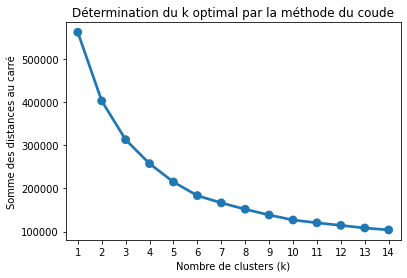

In [ ]:
"""Determining the optimal number of clusters with the elbow method.

We calculate the sum of square distances
for each possible number of clusters.
"""


range_k = range(1, 15)


def calculate_KMeans(Scaled_Data, range_k, n_init=15):
    sum_of_sq_dist = {}
    for k in range_k:
        km = KMeans(n_clusters=k, init='k-means++',
                    max_iter=1000, n_init=n_init)
        km = km.fit(Scaled_Data)
        sum_of_sq_dist[k] = km.inertia_

    # Plot the graph
    # for the sum of square distance values and number of clusters
    sns.pointplot(x=list(sum_of_sq_dist.keys()),
                  y=list(sum_of_sq_dist.values()))
    plt.xlabel('Nombre de clusters (k)')
    plt.ylabel('Somme des distances au carré')
    plt.title('Détermination du k optimal par la méthode du coude')
    plt.show()


calculate_KMeans(Scaled_Data, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.3073769887605267
Pour n_clusters = 3 , le silhouette_score moyen est : 0.3339132433257318
Pour n_clusters = 4 , le silhouette_score moyen est : 0.32576080192810963
Pour n_clusters = 5 , le silhouette_score moyen est : 0.33151151197621437
Pour n_clusters = 6 , le silhouette_score moyen est : 0.3175268470144766
Pour n_clusters = 7 , le silhouette_score moyen est : 0.321339628930385
Pour n_clusters = 8 , le silhouette_score moyen est : 0.32543679728595604


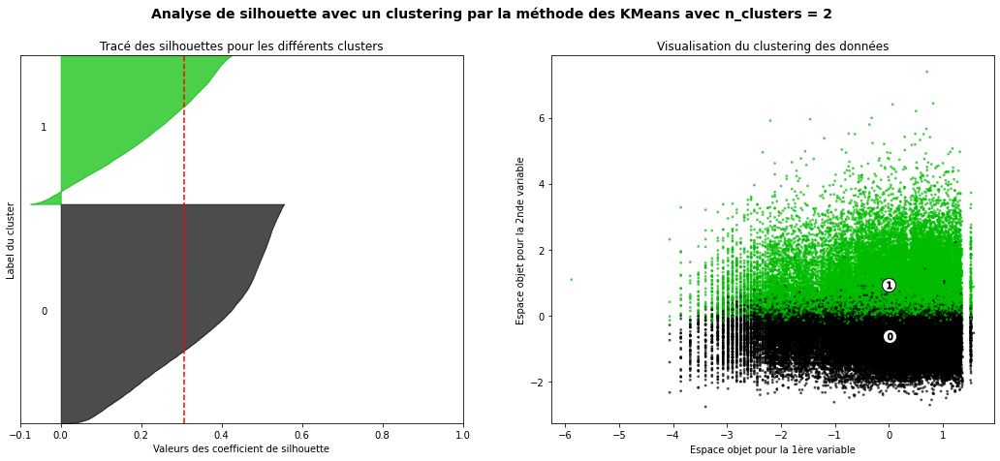

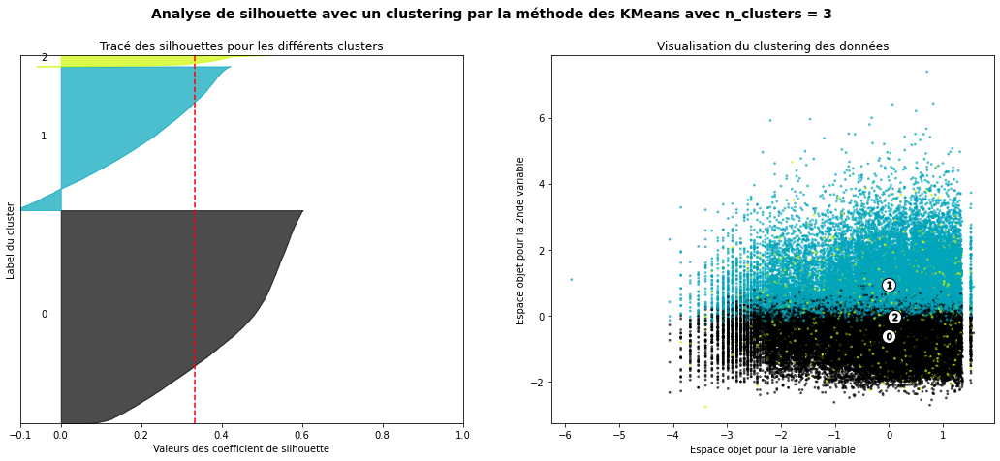

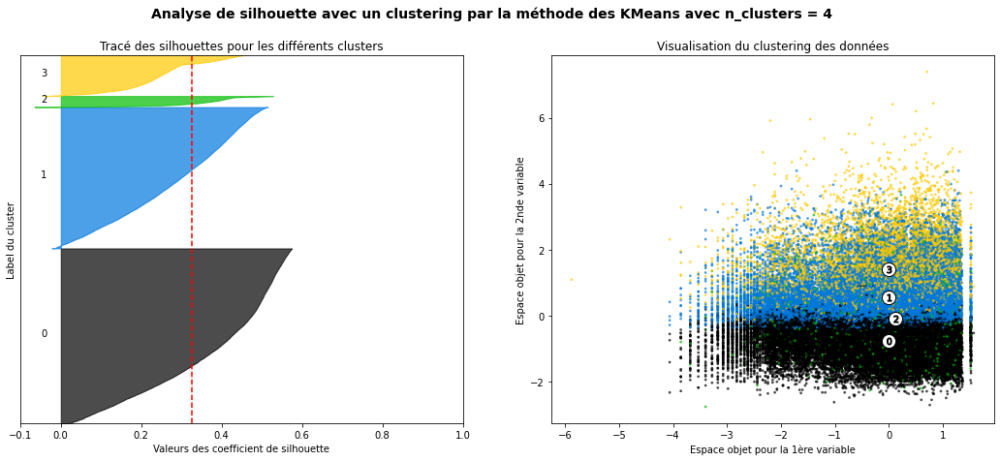

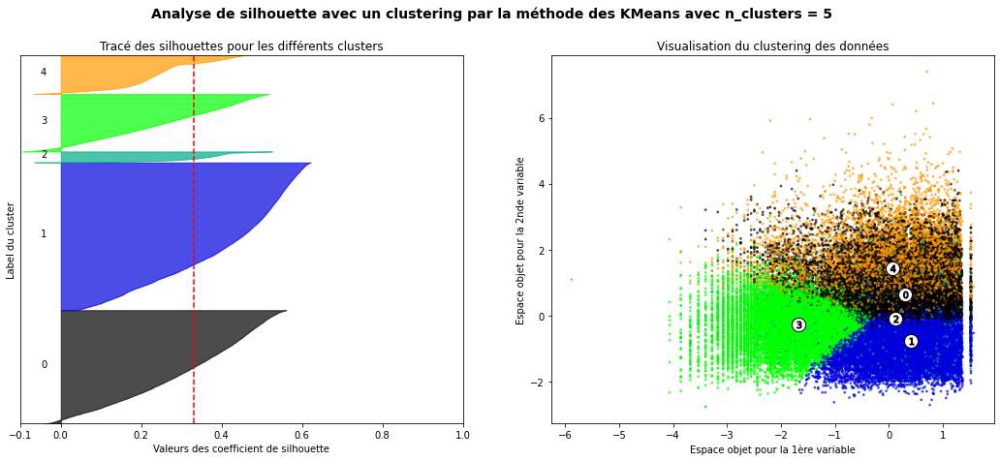

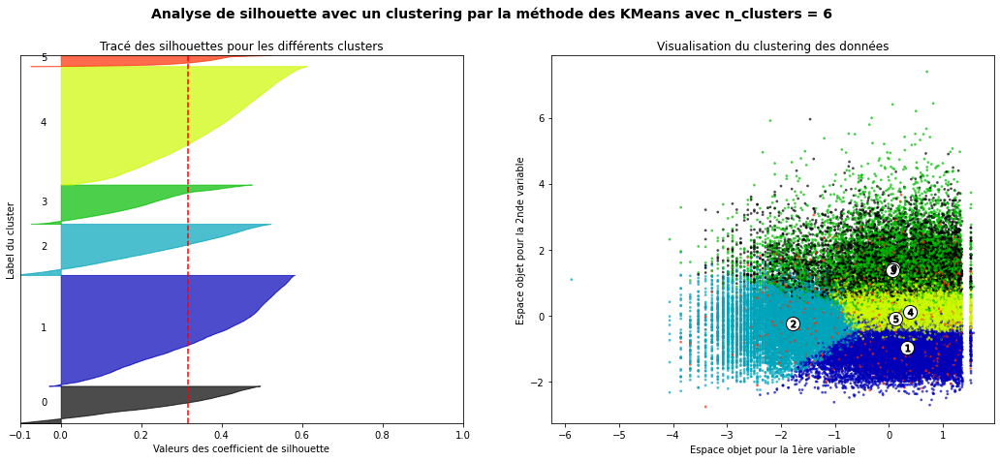

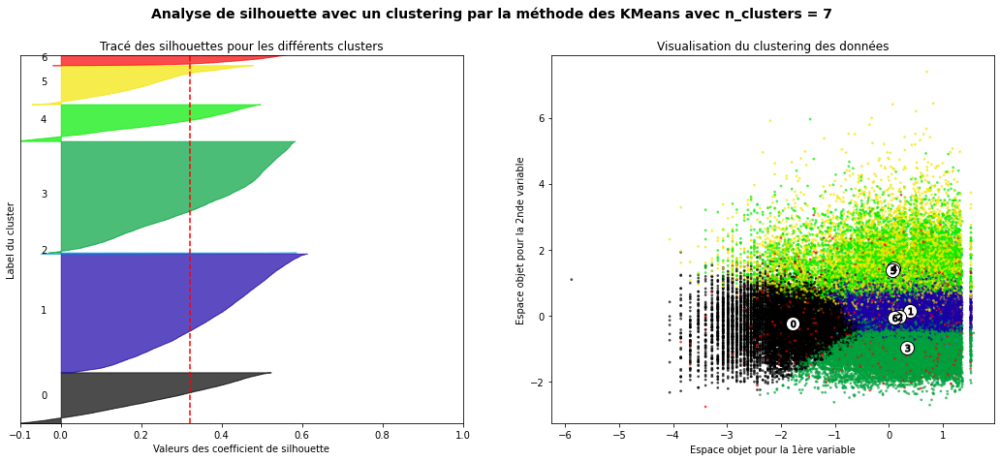

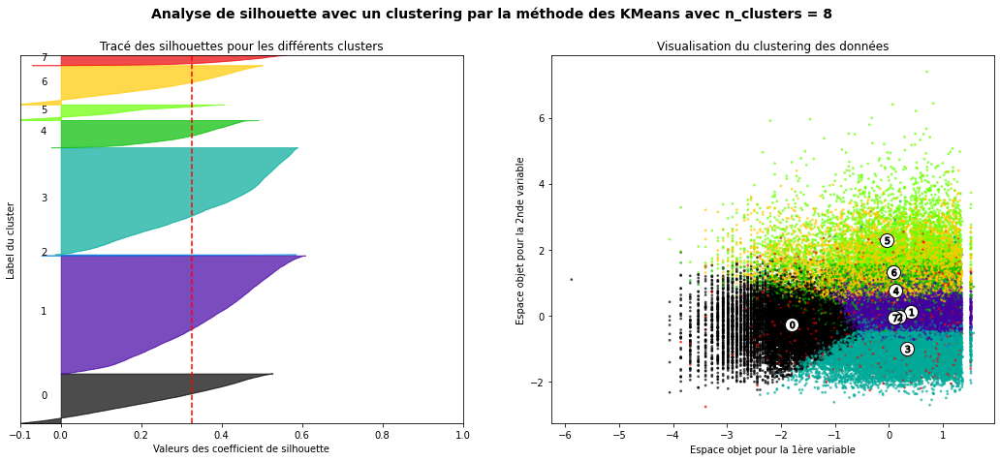

In [ ]:
"""Calculating the silhouette score for various clusterings.

We calculate the average silhouette score for various numbers of clusters:
by fixing a range_n_clusters to study.
We visualise the silhouette plot for the various clustering possibilities.
We visualise the clustered data.
"""


range_n_clusters = [2, 3, 4, 5, 6, 7, 8]


def calculate_silhouette_score(range_n_clusters, Scaled_Data, n_init=15):

    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1
        # but in this example all lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space
        # between silhouette plots of individual clusters,
        # to demarcate them clearly.
        ax1.set_ylim([0, len(Scaled_Data) + (n_clusters+1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters,
                           n_init=n_init, random_state=10)
        cluster_labels = clusterer.fit_predict(Scaled_Data)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation
        # of the formed clusters
        silhouette_avg = silhouette_score(Scaled_Data, cluster_labels)
        print('Pour n_clusters =', n_clusters,
              ', le silhouette_score moyen est :', silhouette_avg)

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(Scaled_Data,
                                                      cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = \
                sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i)/n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper),
                              0, ith_cluster_silhouette_values,
                              facecolor=color, edgecolor=color,
                              alpha=0.7)

            # Label the silhouette plots with their cluster numbers
            # and center it at the middle
            ax1.text(-0.05, y_lower + 0.5*size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title('Tracé des silhouettes pour les différents clusters')
        ax1.set_xlabel('Valeurs des coefficient de silhouette')
        ax1.set_ylabel('Label du cluster')

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color='red', linestyle='--')

        ax1.set_yticks([])  # Clear the yaxis labels/ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float)/n_clusters)
        ax2.scatter(Scaled_Data.iloc[:, 0], Scaled_Data.iloc[:, 1],
                    marker='.', s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor='k')

        # Labeling the clusters
        centers = clusterer.cluster_centers_
        # Draw white circles at cluster centers
        ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                    c="white", alpha=1, s=200, edgecolor='k')

        for i, c in enumerate(centers):
            ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                        s=50, edgecolor='k')

        ax2.set_title('Visualisation du clustering des données')
        ax2.set_xlabel('Espace objet pour la 1ère variable')
        ax2.set_ylabel('Espace objet pour la 2nde variable')

        plt.suptitle(('Analyse de silhouette avec un clustering par la '
                      'méthode des KMeans avec n_clusters = %d' % n_clusters),
                     fontsize=14, fontweight='bold')


calculate_silhouette_score(range_n_clusters, Scaled_Data)


In [ ]:
"""We create a function to perform the clustering"""


def clustering(Scaled_Data, df, n_clusters):
    # Perform K-Mean Clustering or build the K-Means clustering model
    KMean_clust = KMeans(n_clusters=n_clusters,
                         init='k-means++', max_iter=1000)
    KMean_clust.fit(Scaled_Data)

    # Find the clusters for the observation given in the dataset
    df['Cluster'] = KMean_clust.labels_
    return df


clustering(Scaled_Data, df, n_clusters=5)
df.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,116,141.90,1.0,1,141.90,0.084567,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,119,27.19,1.0,1,27.19,0.304892,0
2,0000f46a3911fa3c0805444483337064,542,86.22,1.0,1,86.22,0.199722,0
3,0000f6ccb0745a6a4b88665a16c9f078,326,43.62,1.0,1,43.62,0.404172,0
4,0004aac84e0df4da2b147fca70cf8255,293,196.89,1.0,1,196.89,0.085784,1


## Visualisations des Clusters

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


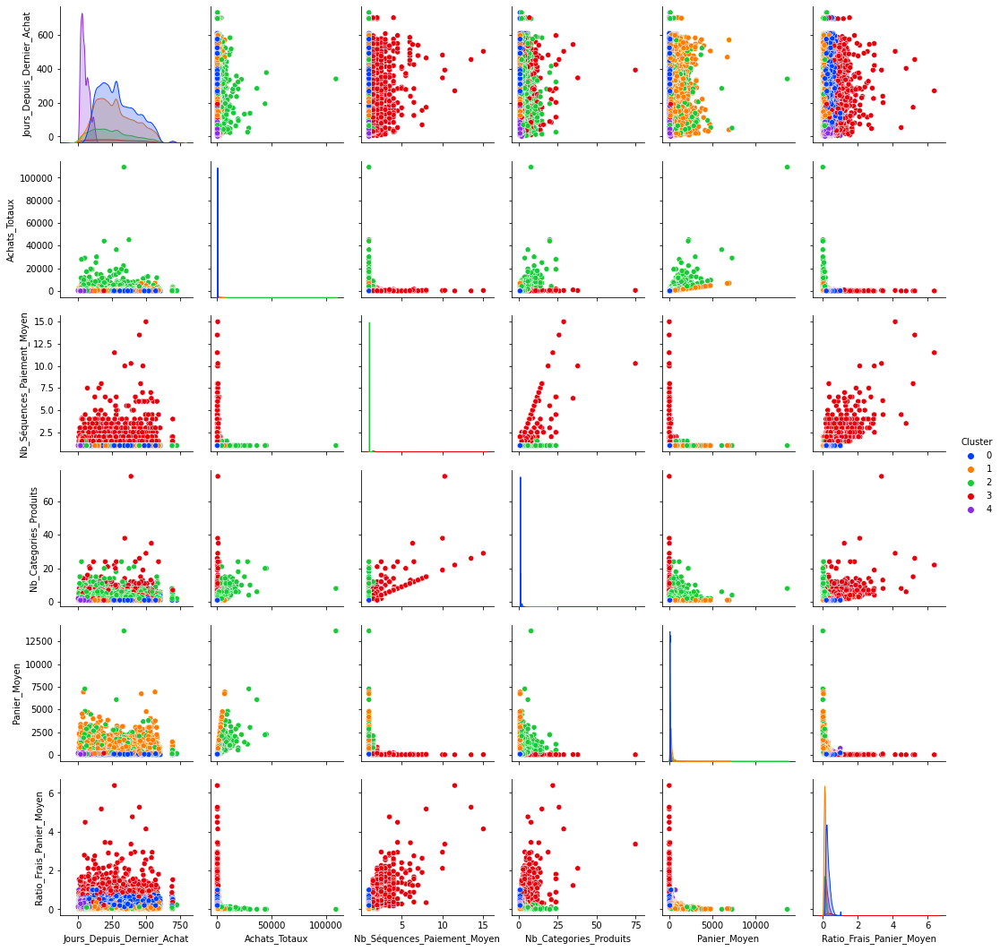

In [ ]:
# 5 clusters
sns.pairplot(df, hue='Cluster', palette='bright')

## Visualisations du comportement des variables par cluster

In [ ]:
list_variables = [
                  'Jours_Depuis_Dernier_Achat',
                  'Achats_Totaux',
                  'Panier_Moyen',
                  'Nb_Séquences_Paiement_Moyen',
                  'Nb_Categories_Produits',
                  'Ratio_Frais_Panier_Moyen',
                  ]

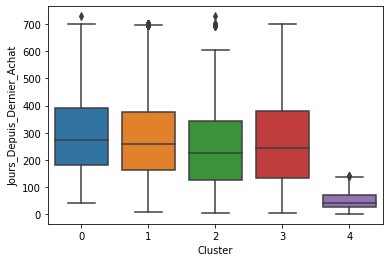

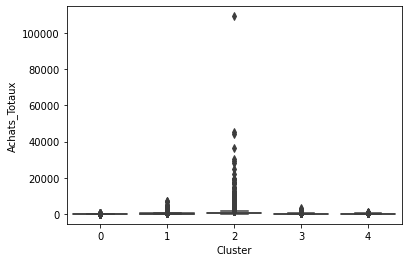

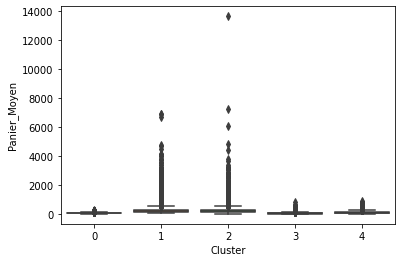

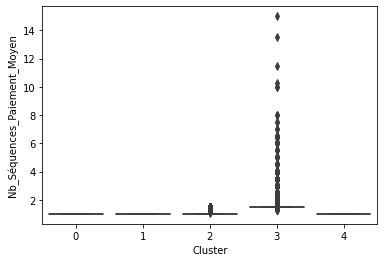

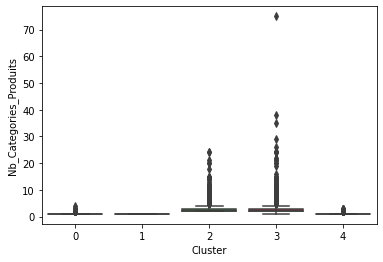

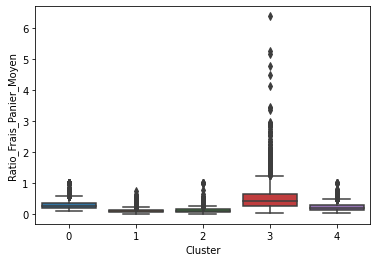

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


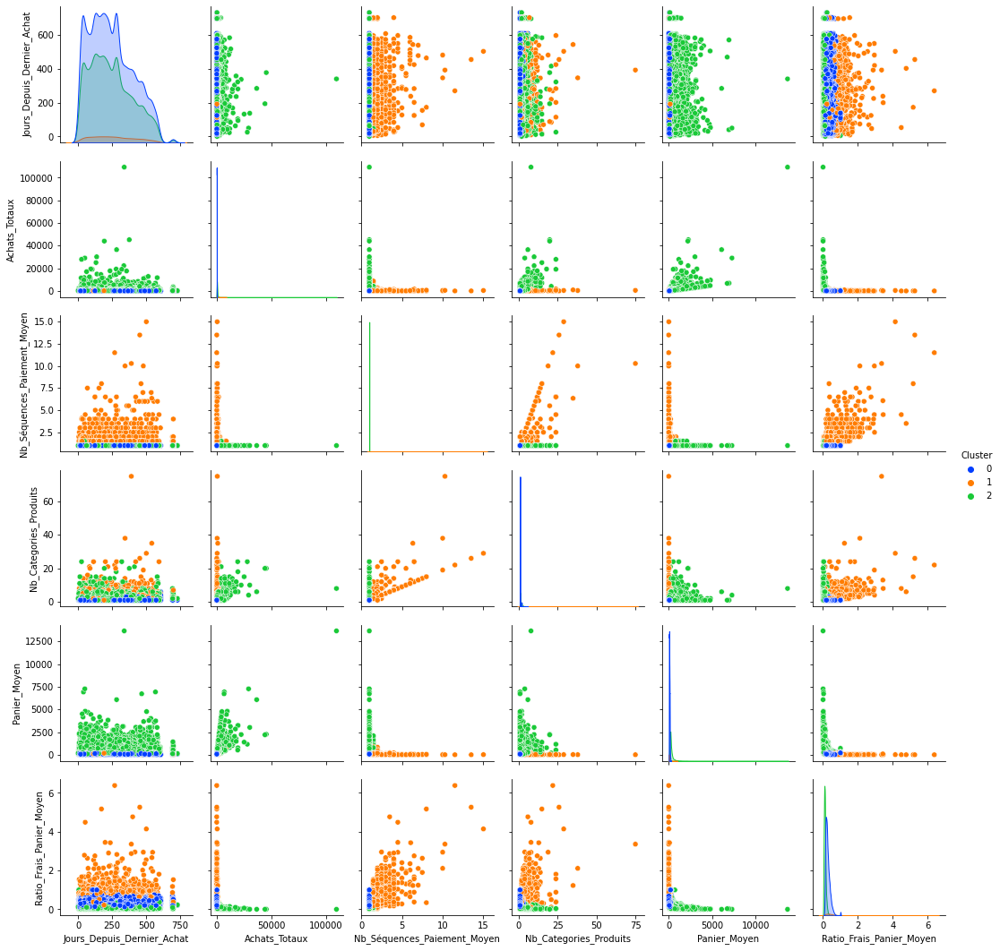

In [ ]:
# 3 clusters
clustering(Scaled_Data, df, n_clusters=3)
sns.pairplot(df, hue='Cluster', palette='bright')

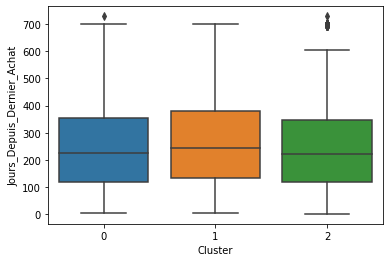

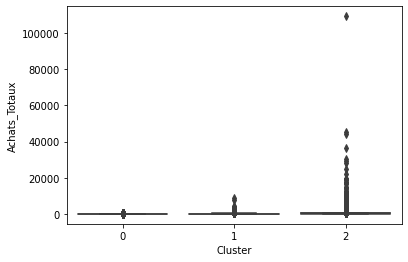

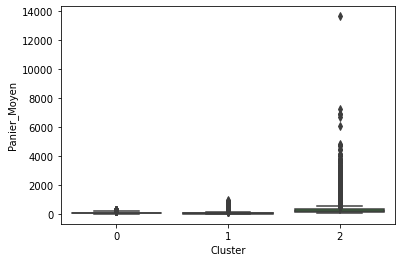

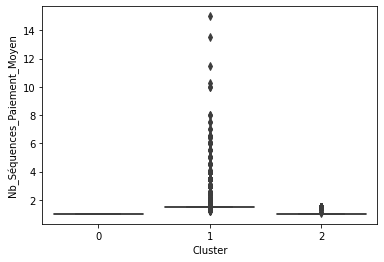

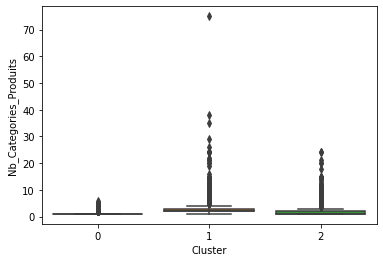

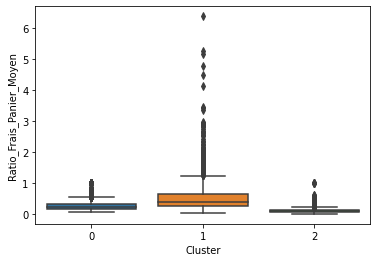

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


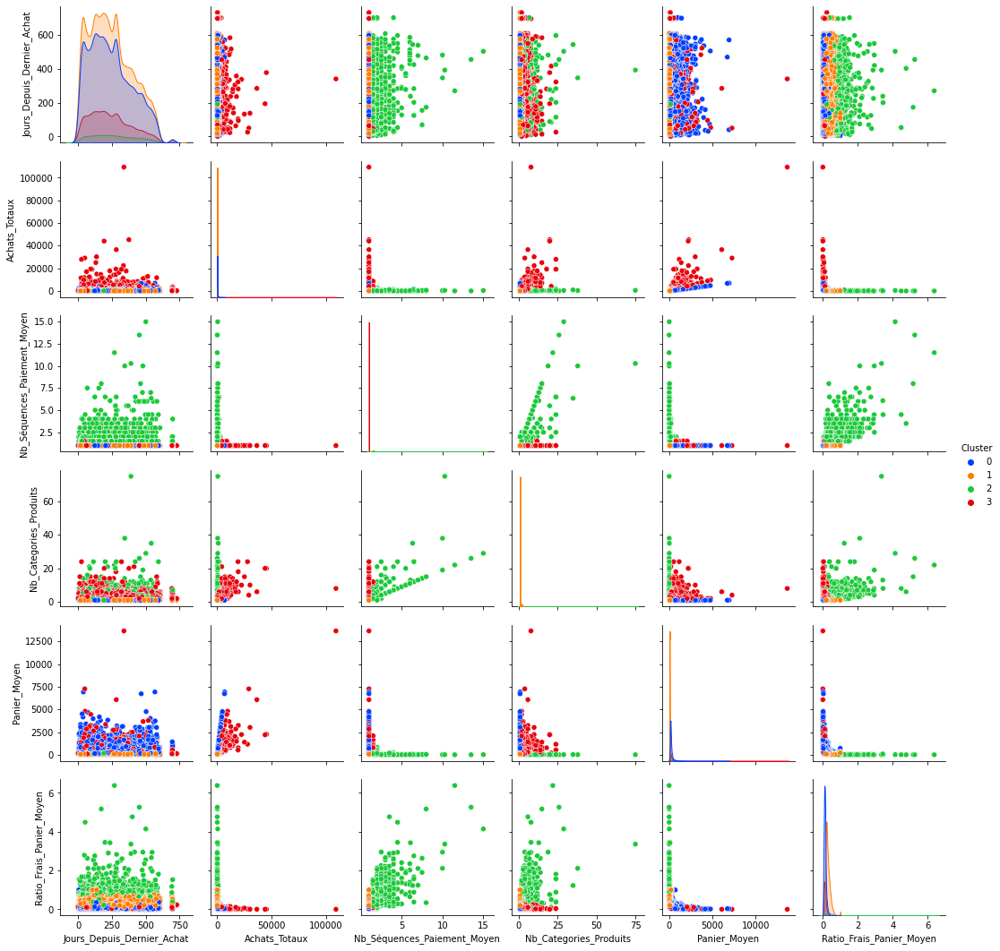

In [ ]:
# 4 clusters
clustering(Scaled_Data, df, n_clusters=4)
sns.pairplot(df, hue='Cluster', palette='bright')

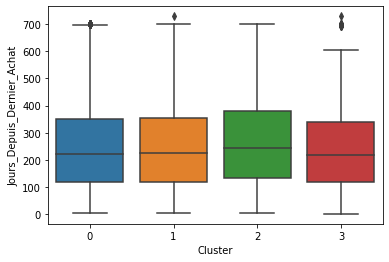

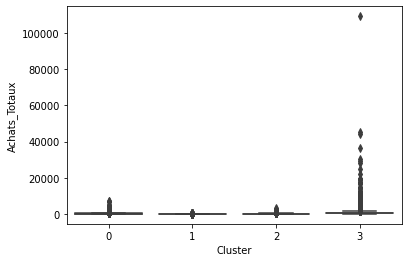

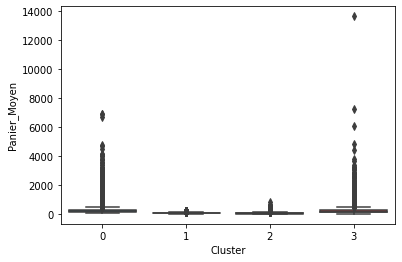

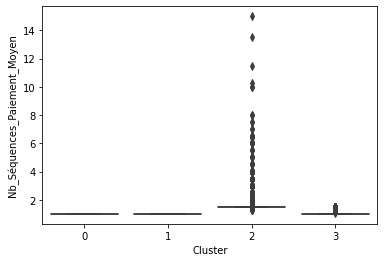

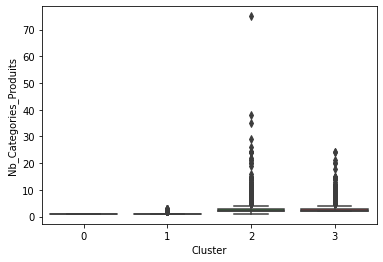

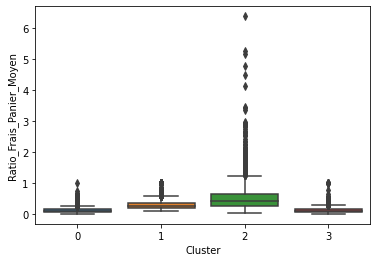

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df)

# Modélisation Temporelle des Clusters

Importer Données

In [ ]:
# If working in google colab
# Import files
uploaded = files.upload()

Saving data6_final.csv to data6_final.csv
Saving data5_final.csv to data5_final.csv
Saving data4_final.csv to data4_final.csv
Saving data3_final.csv to data3_final.csv
Saving data2_final.csv to data2_final.csv
Saving data1_final.csv to data1_final.csv


In [ ]:
# If working in google colab
# Read files
df1 = pd.read_csv(io.BytesIO(uploaded['data1_final.csv']))
df2 = pd.read_csv(io.BytesIO(uploaded['data2_final.csv']))
df3 = pd.read_csv(io.BytesIO(uploaded['data3_final.csv']))
df4 = pd.read_csv(io.BytesIO(uploaded['data4_final.csv']))
df5 = pd.read_csv(io.BytesIO(uploaded['data5_final.csv']))
df6 = pd.read_csv(io.BytesIO(uploaded['data6_final.csv']))

In [ ]:
# If working in Jupyter
# Read files
df1 = pd.read_csv('data1_final.csv')
df2 = pd.read_csv('data2_final.csv')
df3 = pd.read_csv('data3_final.csv')
df4 = pd.read_csv('data4_final.csv')
df5 = pd.read_csv('data5_final.csv')
df6 = pd.read_csv('data6_final.csv')

In [ ]:
# Work on copies
df_1 = df1.copy()
df_2 = df2.copy()
df_3 = df3.copy()
df_4 = df4.copy()
df_5 = df5.copy()
df_6 = df6.copy()

Période 1

In [ ]:
df_1.shape

(306, 9)

In [ ]:
df_1.drop(columns=['Unnamed: 0', 'Periode'],
          inplace=True)
df_1.sample(5)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
257,d93a22bb52bb2f41a7267b8a02370781,76,153.51,1.0,1,153.51,0.120578
67,33fbcb38d3009eddfe53b3063c642959,75,61.64,1.0,1,61.64,0.190461
188,a311db8053cf14527828dd6d89a1f57a,80,113.17,1.0,1,113.17,0.205620
81,3e36312a56bdb312242490706752940b,75,192.56,1.0,1,192.56,0.117678
248,d60a512747263c5307fef65a58ff7532,77,85.08,1.0,1,85.08,0.295957


Transformation au log

In [ ]:
transformation_log(df_1)
Log_Tfd_Data_1 = Log_Tfd_Data

In [ ]:
Log_Tfd_Data_1.shape

(306, 6)

Standardisation

In [ ]:
calculate_standardisation(Log_Tfd_Data_1, df_1)
Scaled_Data_1 = Scaled_Data

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                    0.075555  ...                 -0.414805
1                   -0.130801  ...                 -1.300484
2                   -0.075244  ...                  0.058806
3                   -0.023655  ...                 -2.540701
4                   -0.075244  ...                 -0.929890

[5 rows x 6 columns]


Clustering

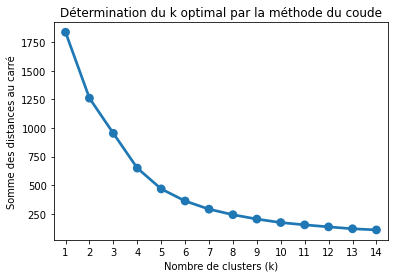

In [ ]:
range_k = range(1, 15)

calculate_KMeans(Scaled_Data_1, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.403305465687324
Pour n_clusters = 3 , le silhouette_score moyen est : 0.46350365992192577
Pour n_clusters = 4 , le silhouette_score moyen est : 0.4737828812159405
Pour n_clusters = 5 , le silhouette_score moyen est : 0.46600962727161344
Pour n_clusters = 6 , le silhouette_score moyen est : 0.4120963863775766
Pour n_clusters = 7 , le silhouette_score moyen est : 0.4157071192068527
Pour n_clusters = 8 , le silhouette_score moyen est : 0.43083957808468515


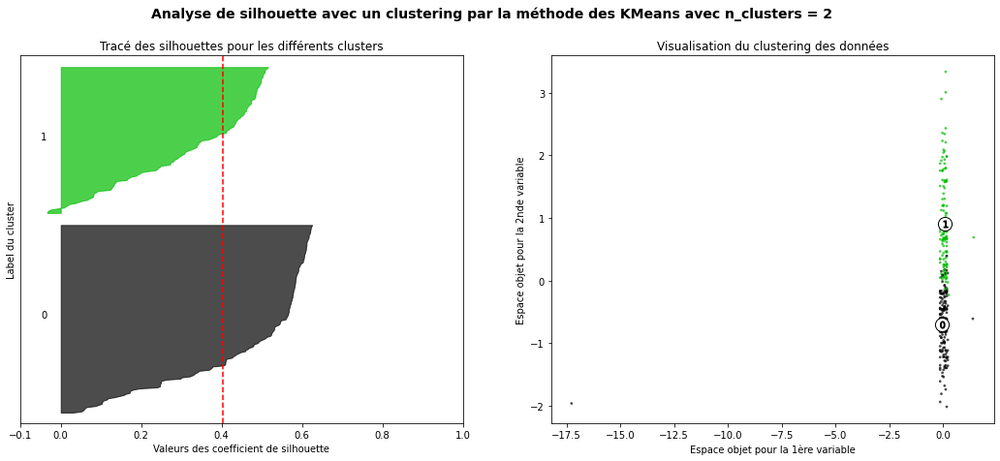

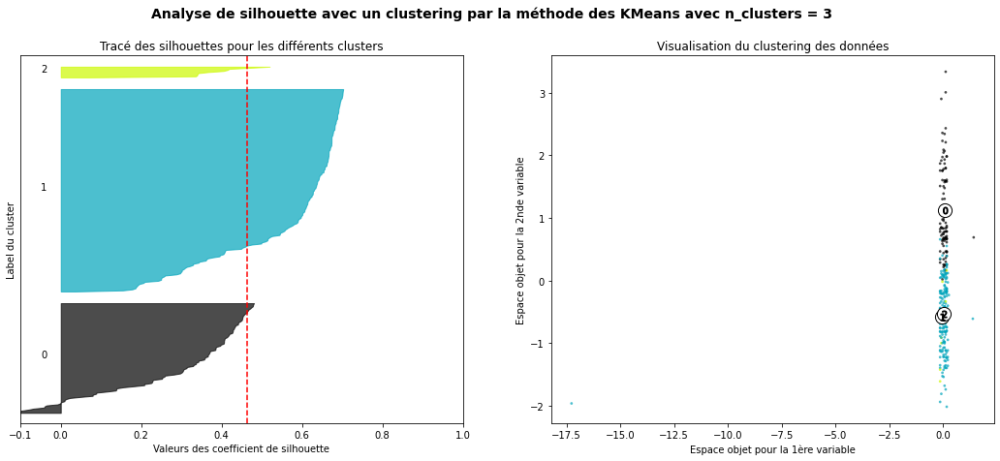

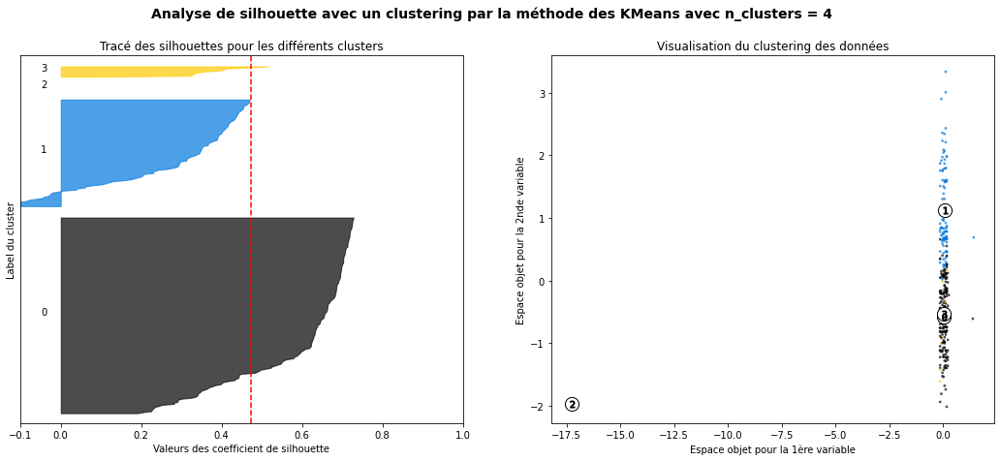

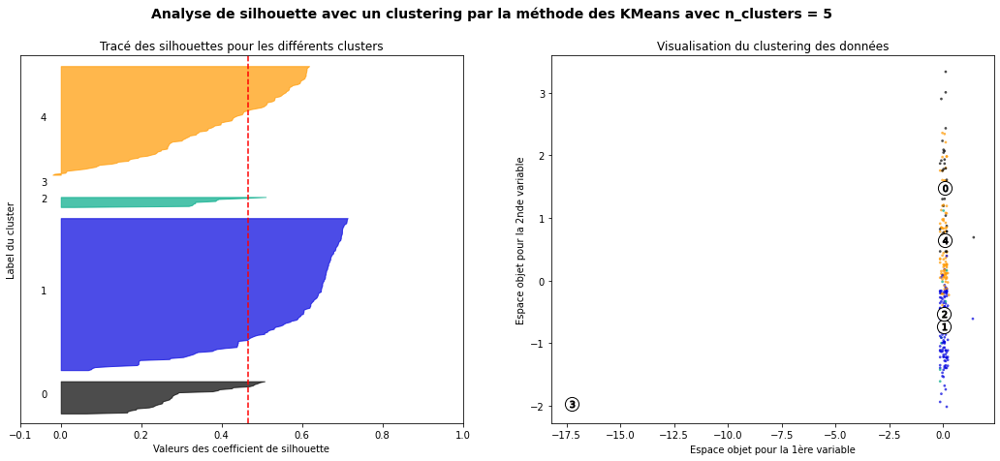

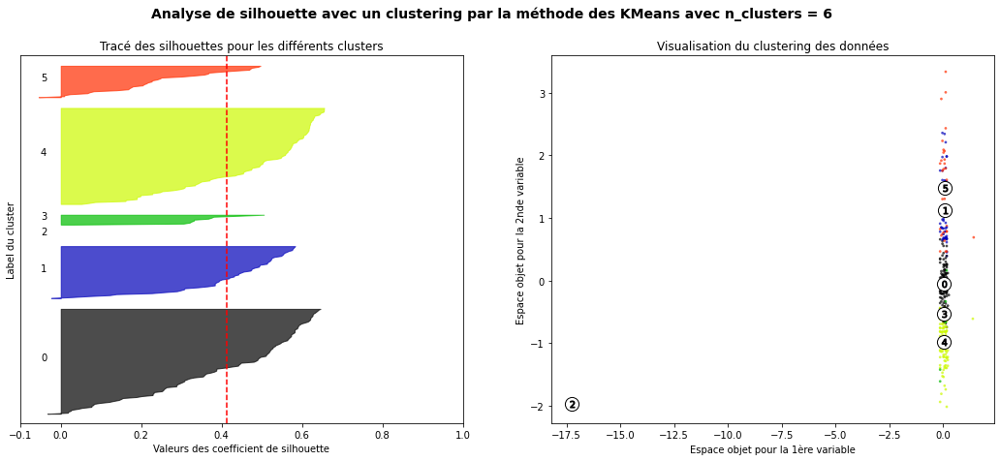

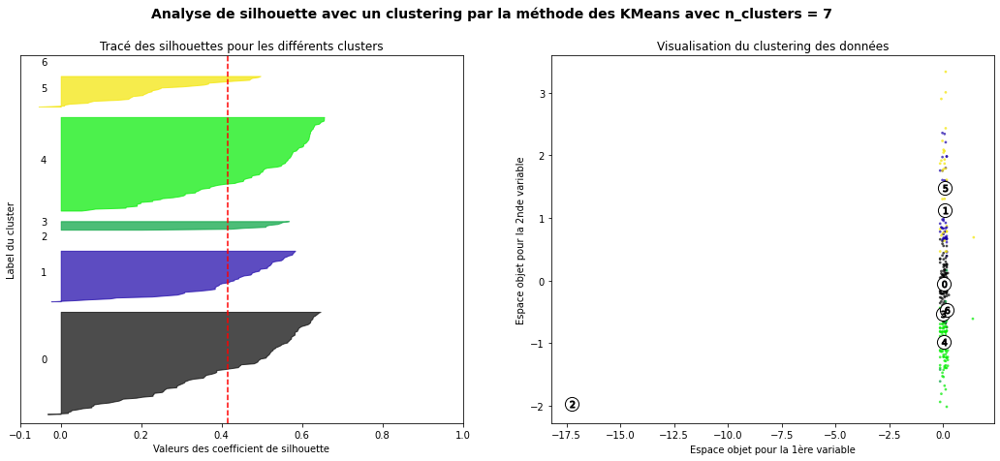

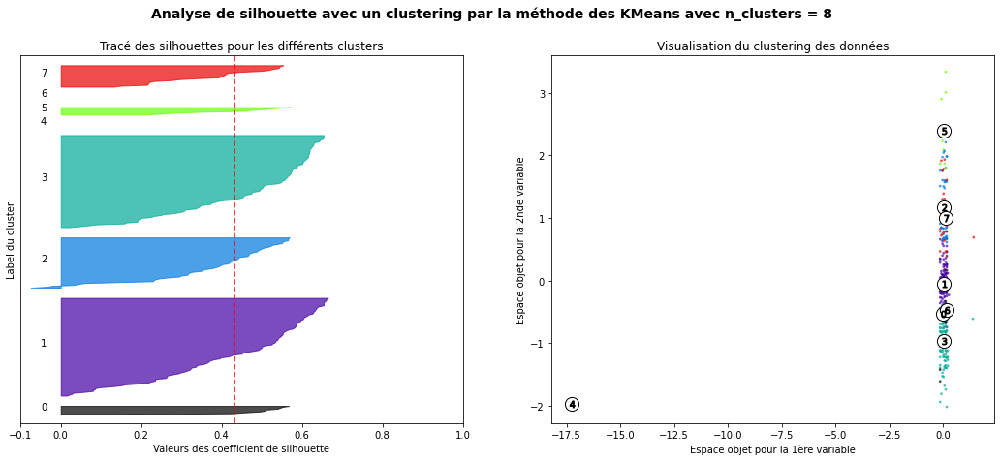

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

calculate_silhouette_score(range_n_clusters, Scaled_Data_1)

In [ ]:
clustering(Scaled_Data_1, df_1, n_clusters=5)
df_1.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0032c76b20340da25249092a268ce66c,79,144.94,1.0,1,144.94,0.110666,2
1,01f156677184504063bd19739f924af1,75,784.80,1.0,1,784.80,0.057110,2
2,0313291a6f4f16df04dcf819d88c38ef,76,112.78,1.0,1,112.78,0.157652,0
3,0636d30c77f0f9cfad81f1c9b58c791f,77,971.96,1.0,1,971.96,0.022604,2
4,0659f2d6cabae94afd4d009c6d0e07dc,76,918.28,1.0,2,459.14,0.075293,4


Visualisation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

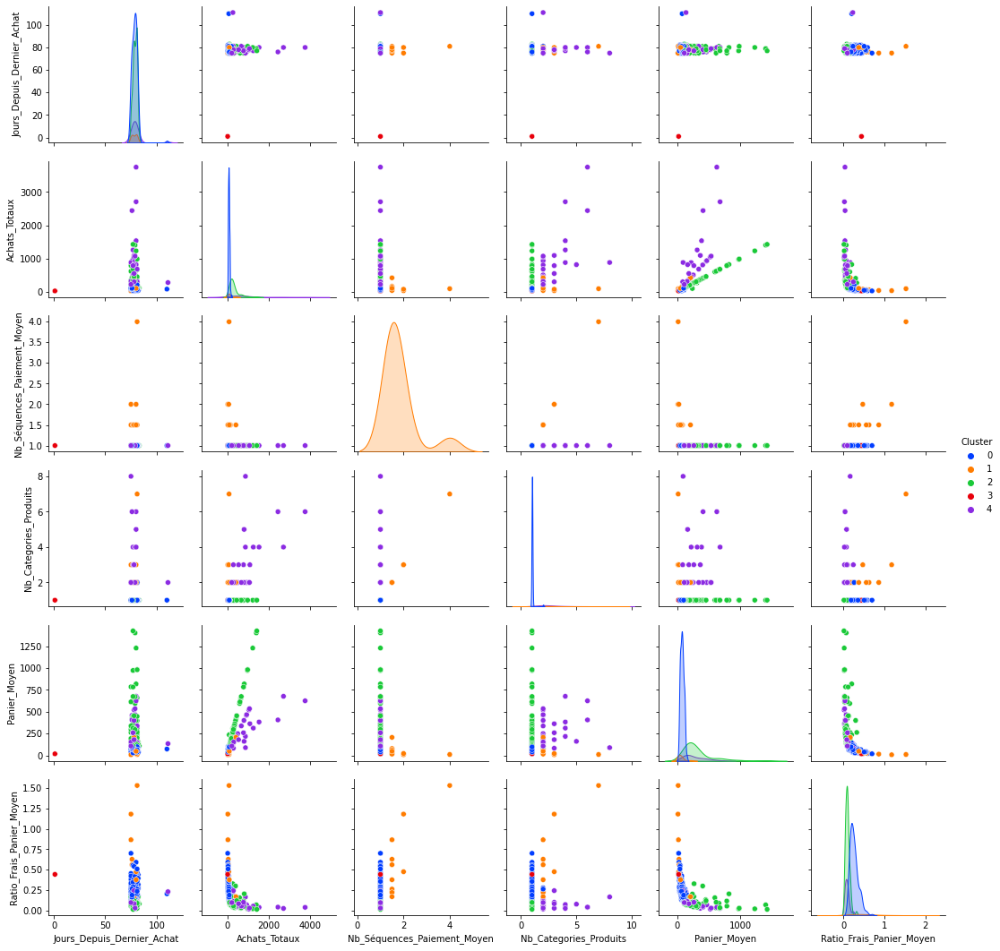

In [ ]:
sns.pairplot(df_1, hue='Cluster', palette='bright')

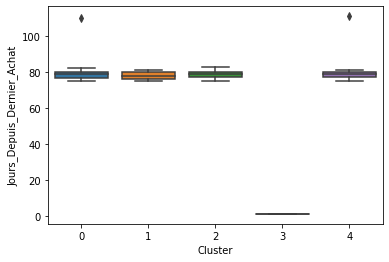

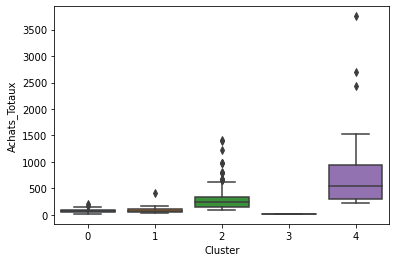

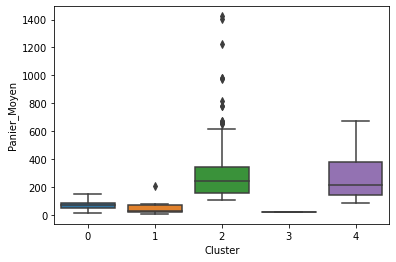

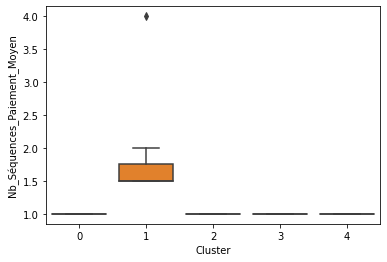

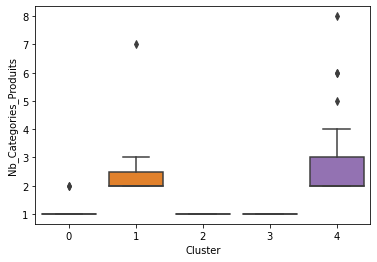

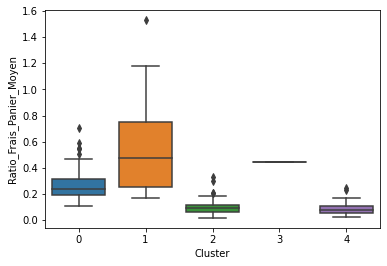

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_1)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning

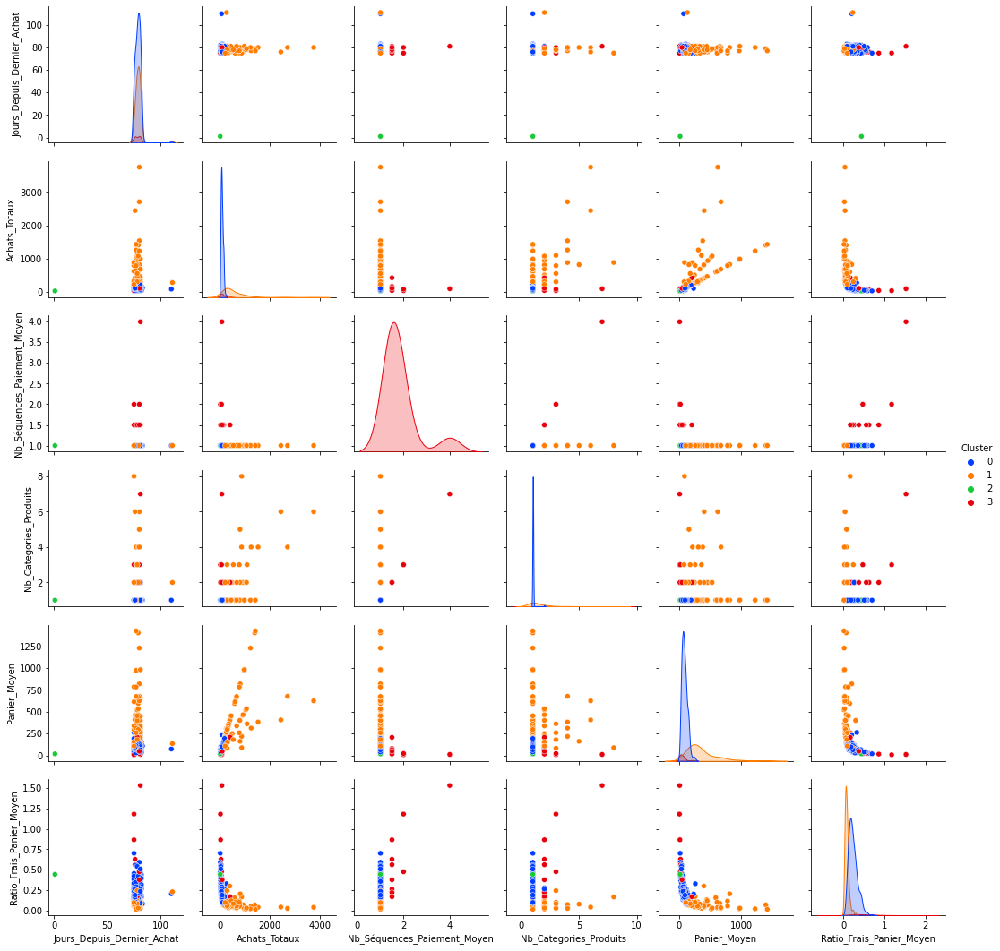

In [ ]:
# 4 clusters
clustering(Scaled_Data_1, df_1, n_clusters=4)

sns.pairplot(df_1, hue='Cluster', palette='bright')

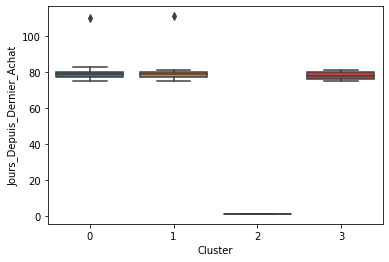

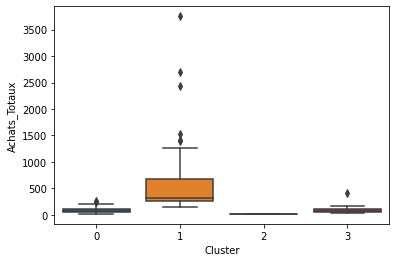

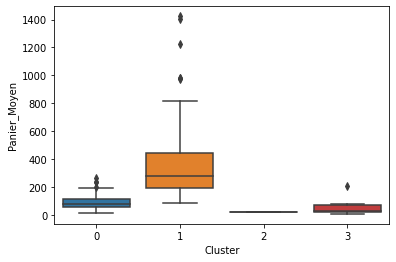

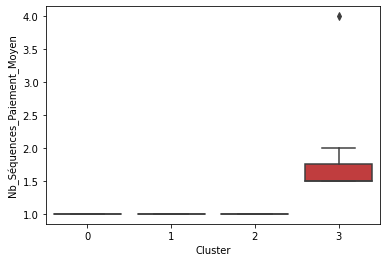

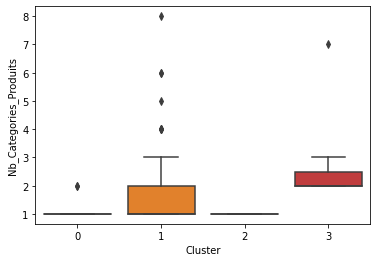

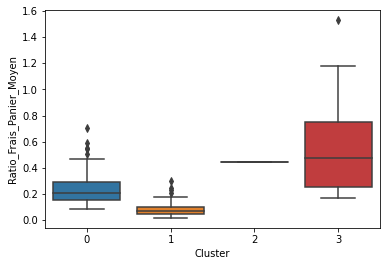

In [ ]:
# 4 clusters
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_1)

Période 2

In [ ]:
df_2.shape

(7198, 9)

In [ ]:
df_2.drop(columns=['Unnamed: 0', 'Periode'],
          inplace=True)
df_2.sample(5)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
2145,4b45c236d7ff26dd4c92c934080970be,67,94.22,1.0,1,94.22,0.151985
5598,c54c21c317f9d2fe7d606bb22820d021,58,69.75,1.0,1,69.75,0.211470
4795,a8f4d39552927a425201f147d0c7653f,19,75.50,1.5,2,37.75,0.386755
6774,f082a32f9abe1b8678ef88c7fceab40f,86,65.64,1.0,1,65.64,0.238422
3624,8011414ecfb5c73b38915605c6a59b21,8,100.54,1.0,1,100.54,0.205291


Transformation au log

In [ ]:
transformation_log(df_2)
Log_Tfd_Data_2 = Log_Tfd_Data

In [ ]:
Log_Tfd_Data_2.shape

(7198, 6)

Standardisation

In [ ]:
calculate_standardisation(Log_Tfd_Data_2, df_2)
Scaled_Data_2 = Scaled_Data

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                    0.399298  ...                  0.258757
1                    0.513683  ...                 -0.674579
2                    1.085613  ...                  0.339264
3                   -1.704772  ...                 -0.759180
4                   -1.139140  ...                  0.163241

[5 rows x 6 columns]


Clustering

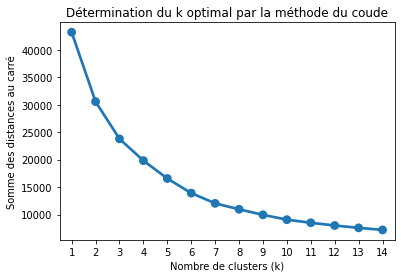

In [ ]:
range_k = range(1, 15)

calculate_KMeans(Scaled_Data_2, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.320357027376987
Pour n_clusters = 3 , le silhouette_score moyen est : 0.3486917937480911
Pour n_clusters = 4 , le silhouette_score moyen est : 0.28680102159691373
Pour n_clusters = 5 , le silhouette_score moyen est : 0.317478462323604
Pour n_clusters = 6 , le silhouette_score moyen est : 0.33819298985344093
Pour n_clusters = 7 , le silhouette_score moyen est : 0.34284530753357845
Pour n_clusters = 8 , le silhouette_score moyen est : 0.35147440597182317


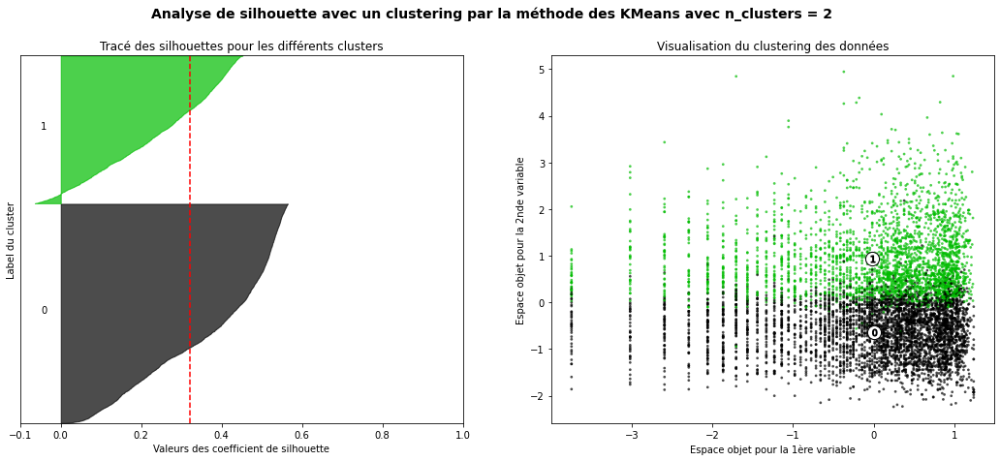

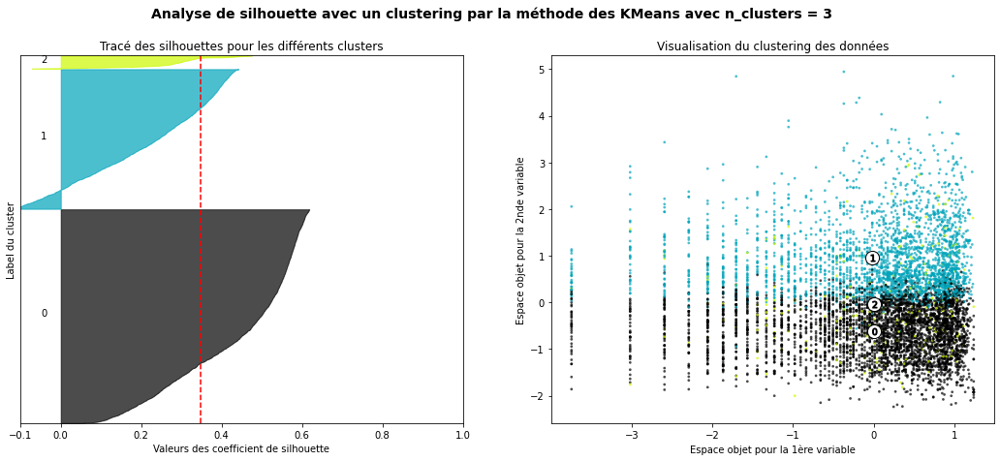

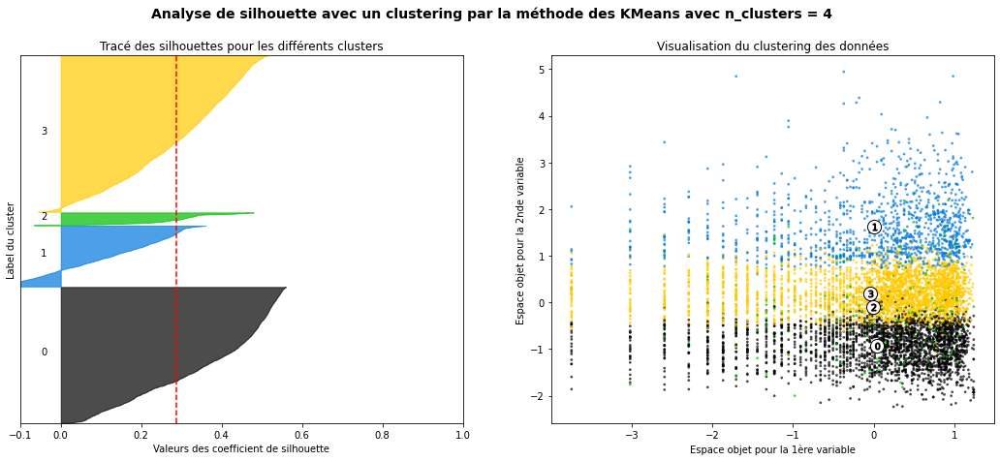

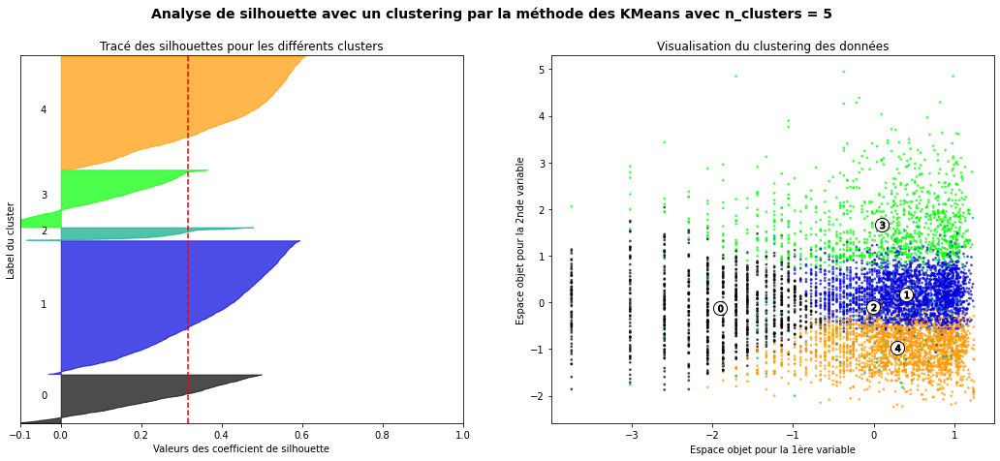

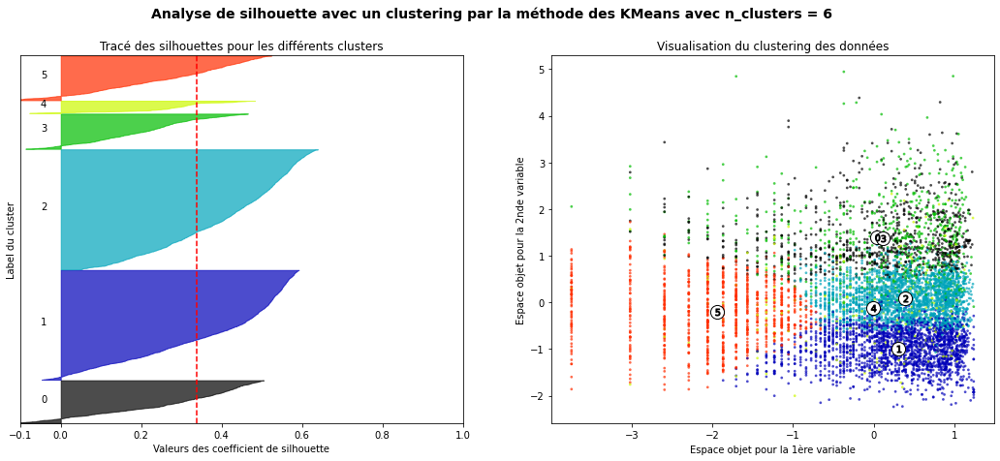

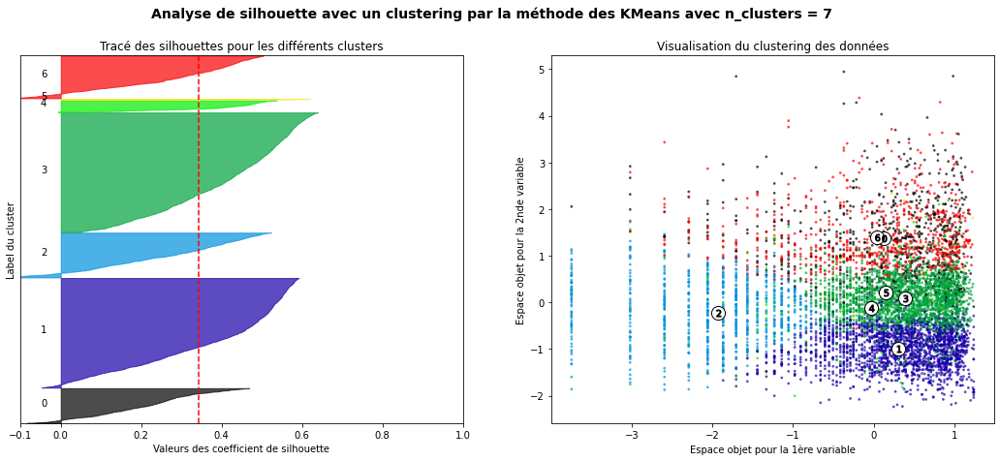

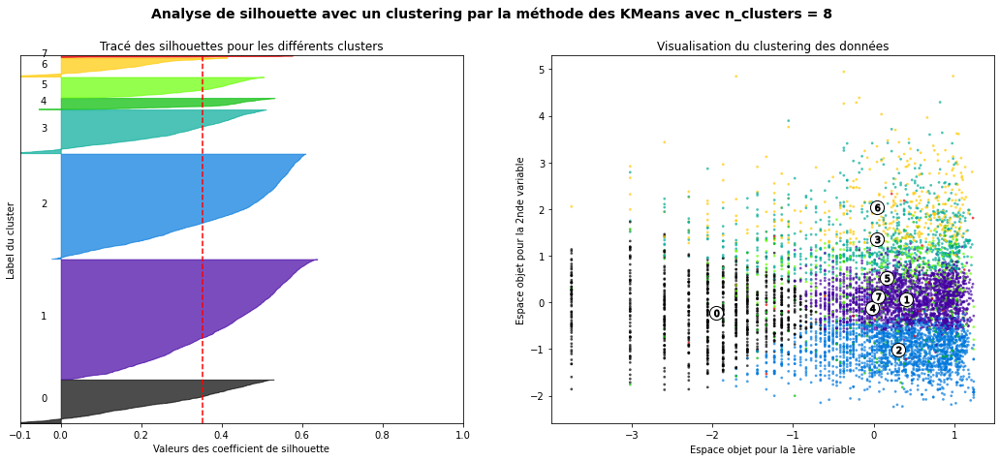

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

calculate_silhouette_score(range_n_clusters, Scaled_Data_2)

In [ ]:
clustering(Scaled_Data_2, df_2, n_clusters=5)
df_2.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0000f46a3911fa3c0805444483337064,52,86.22,1.0,1,86.22,0.199722,4
1,0005e1862207bf6ccc02e4228effd9a0,58,150.12,1.0,1,150.12,0.100719,4
2,00115fc7123b5310cf6d3a3aa932699e,100,76.11,1.0,1,76.11,0.211799,0
3,0011805441c0d1b68b48002f1d005526,7,297.14,1.0,1,297.14,0.094703,3
4,00191a9719ef48ebb5860b130347bf33,12,58.86,1.0,1,58.86,0.186205,3


Visualisation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


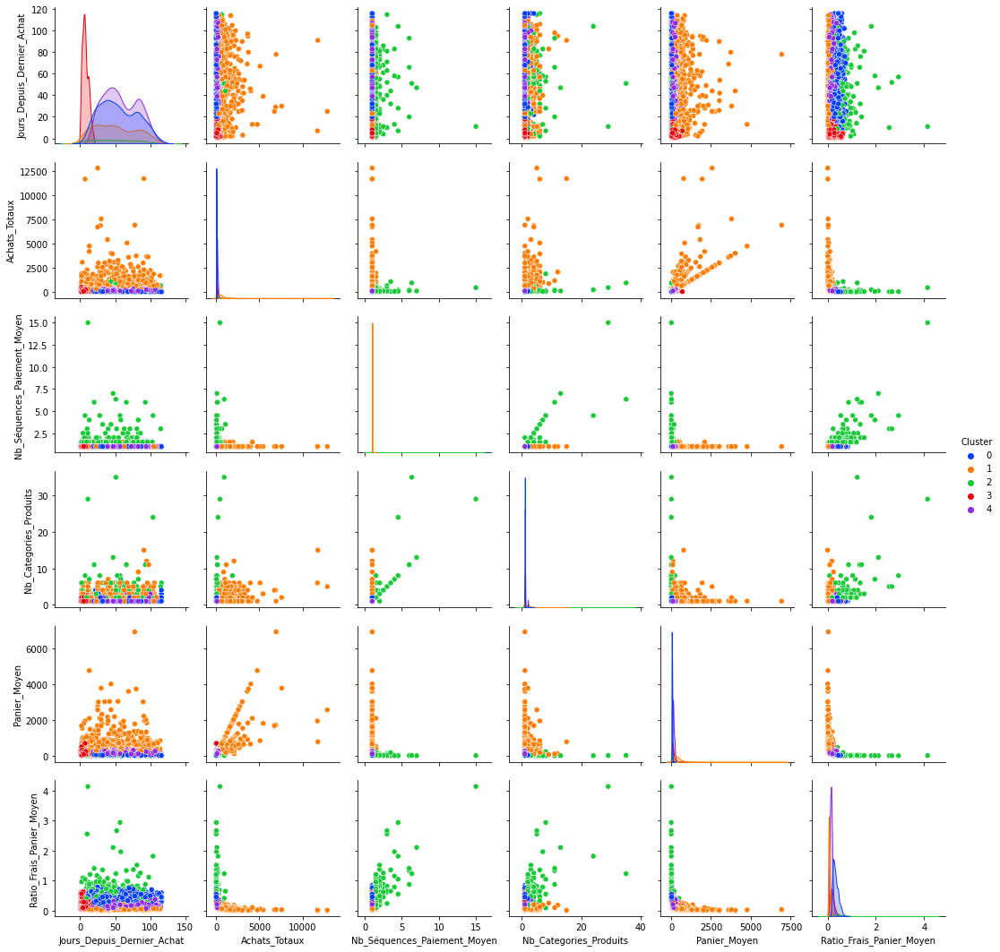

In [ ]:
sns.pairplot(df_2, hue='Cluster', palette='bright')

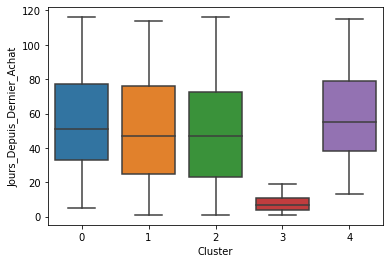

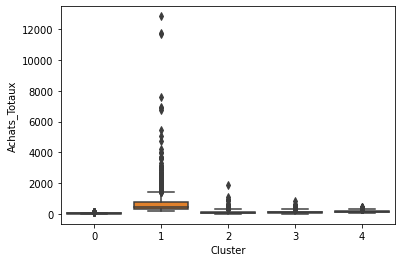

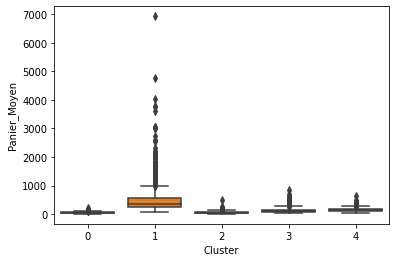

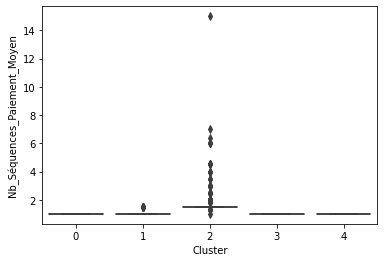

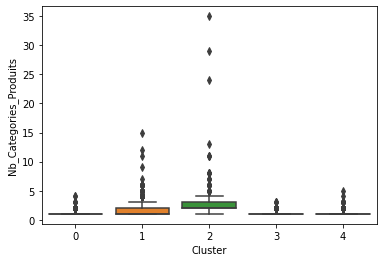

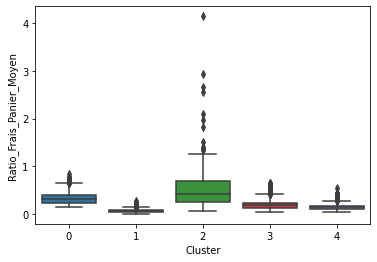

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_2)

In [ ]:
clustering(Scaled_Data_2, df_2, n_clusters=4)
sns.pairplot(df_2, hue='Cluster', palette='bright')

In [ ]:
# 4 clusters:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_2)

Période 3

In [ ]:
df_3.shape

(14425, 9)

In [ ]:
df_3.drop(columns=['Unnamed: 0', 'Periode'],
          inplace=True)
df_3.sample(2)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
3749,425a3da36e86428035913c7df67a24d0,64,80.20,1.0,1,80.20,0.189526
7899,8ad49876ffc5a021f830c103a75544c5,67,46.01,1.0,1,46.01,0.350141


Transformation au log

In [ ]:
transformation_log(df_3)
Log_Tfd_Data_3 = Log_Tfd_Data

In [ ]:
Log_Tfd_Data_3.shape

(14425, 6)

Standardisation

In [ ]:
calculate_standardisation(Log_Tfd_Data_3, df_3)
Scaled_Data_3 = Scaled_Data

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                    0.042278  ...                  1.645389
1                   -0.741620  ...                 -0.078171
2                   -1.088304  ...                 -1.615167
3                    0.190416  ...                 -0.995202
4                   -3.874124  ...                 -0.731143

[5 rows x 6 columns]


Clustering

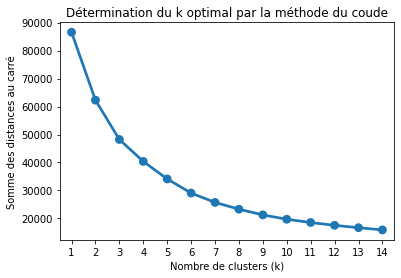

In [ ]:
range_k = range(1, 15)

calculate_KMeans(Scaled_Data_3, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.3144245655103726
Pour n_clusters = 3 , le silhouette_score moyen est : 0.34670649912251567
Pour n_clusters = 4 , le silhouette_score moyen est : 0.32980554440598076
Pour n_clusters = 5 , le silhouette_score moyen est : 0.33265685340357487
Pour n_clusters = 6 , le silhouette_score moyen est : 0.31410735793030337
Pour n_clusters = 7 , le silhouette_score moyen est : 0.3193509248147434
Pour n_clusters = 8 , le silhouette_score moyen est : 0.28820923300895906


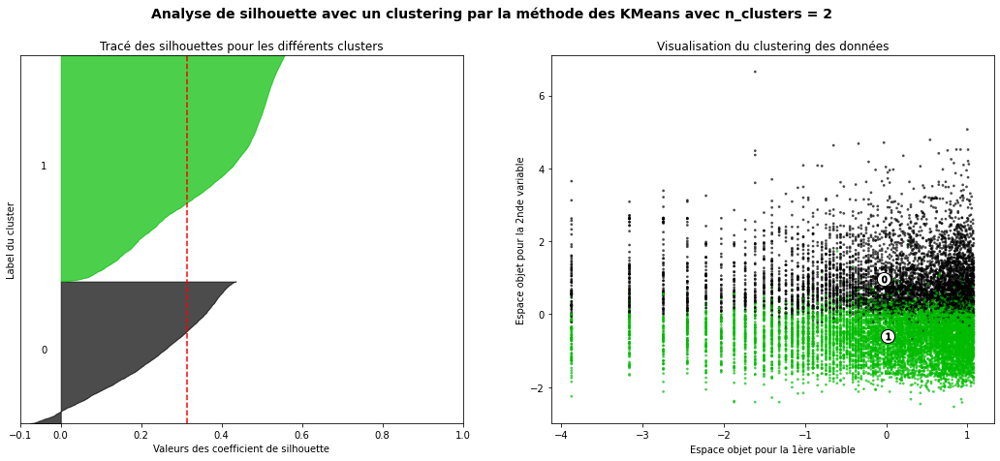

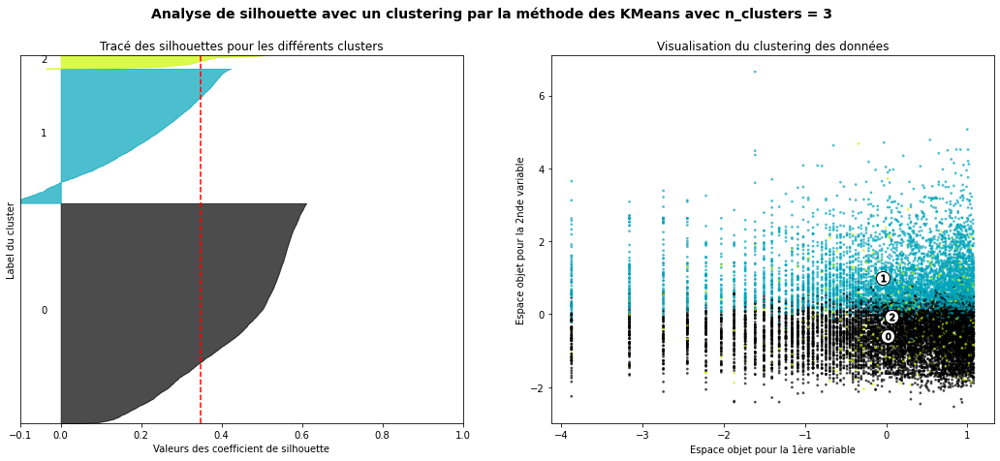

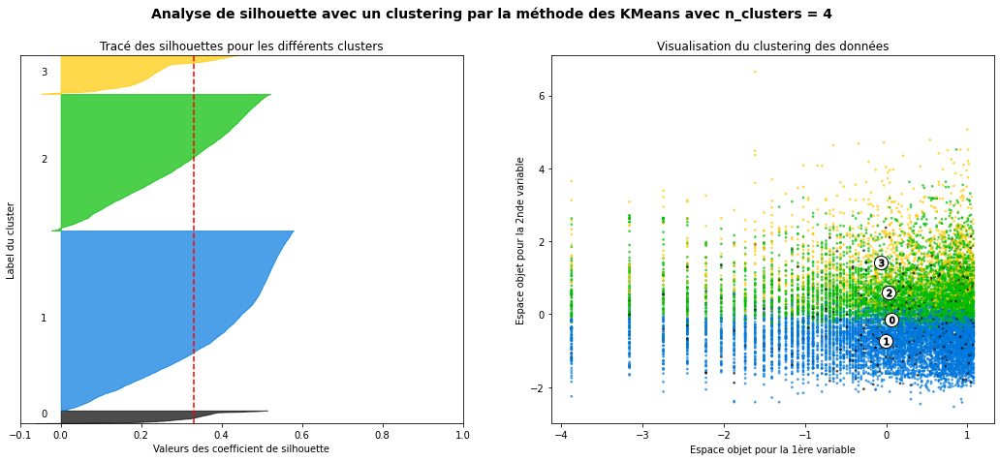

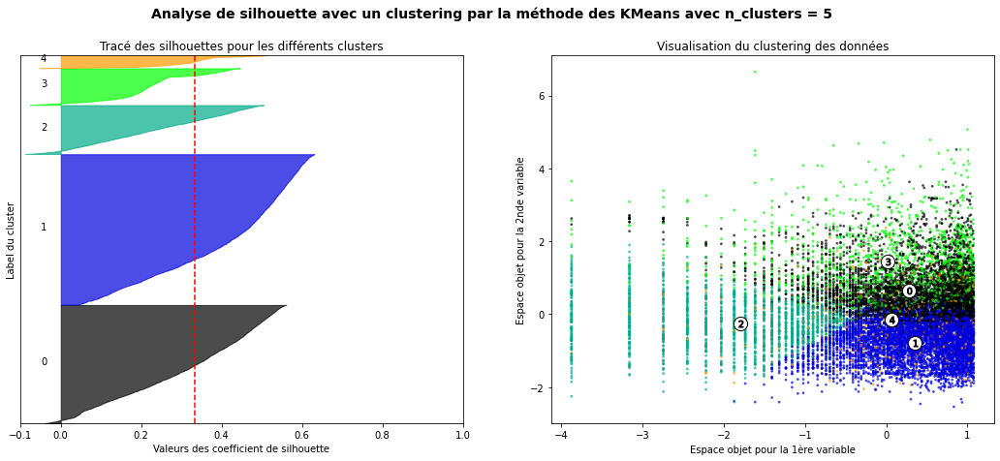

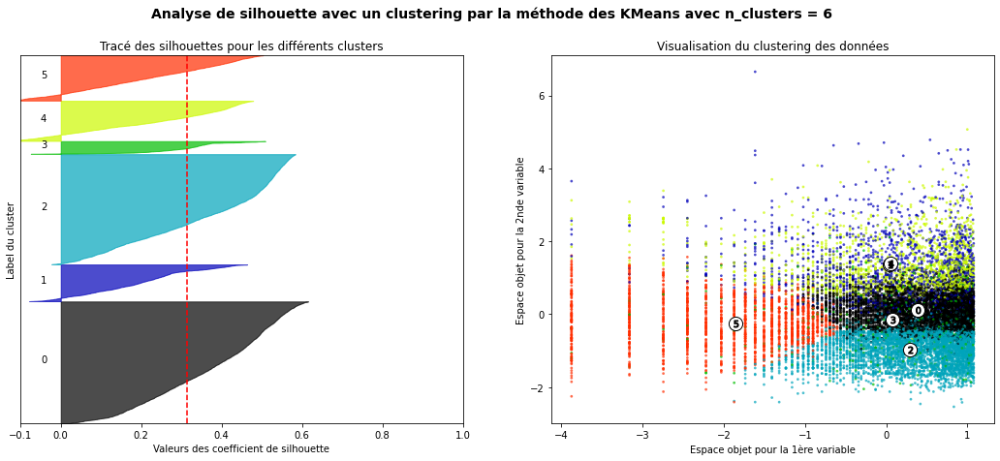

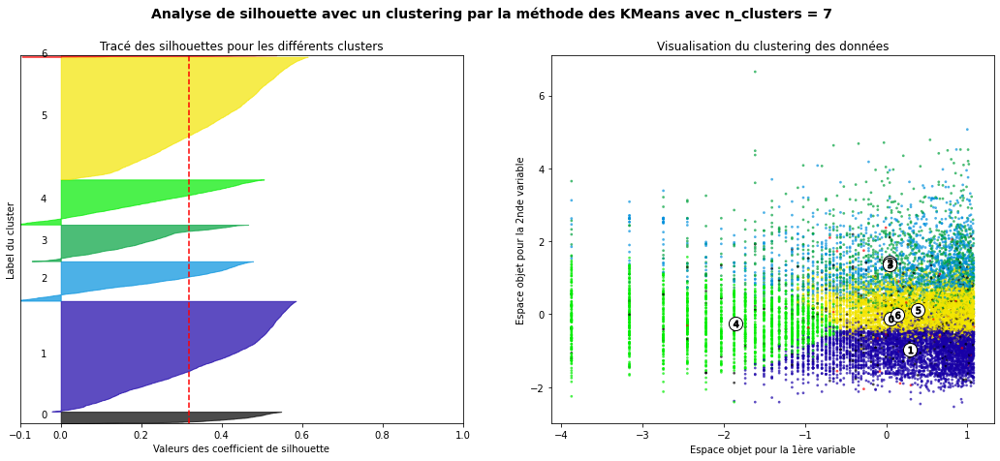

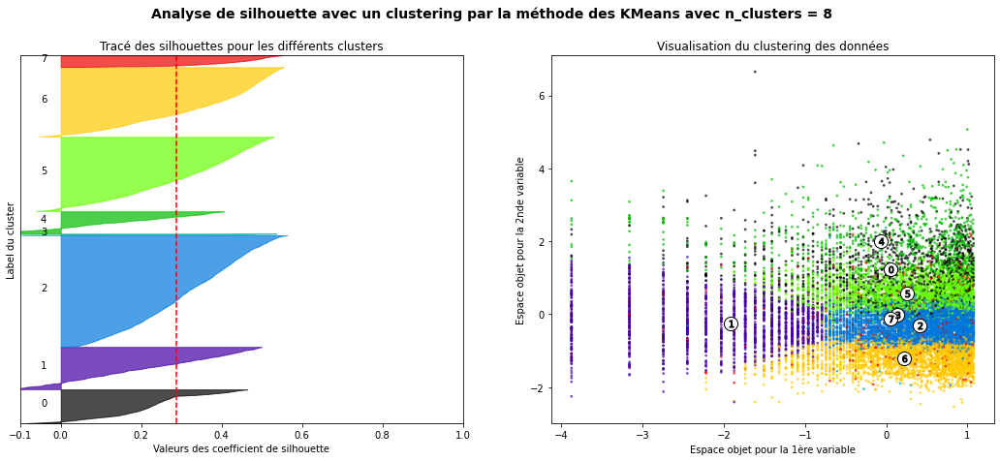

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

calculate_silhouette_score(range_n_clusters, Scaled_Data_3)

In [ ]:
clustering(Scaled_Data_3, df_3, n_clusters=5)
df_3.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0006fdc98a402fceb4eb0ee528f6a8d4,45,29.00,1.0,1,29.00,0.520690,1
1,000a5ad9c4601d2bbdd9ed765d5213b3,21,91.28,1.0,1,91.28,0.156551,3
2,000de6019bb59f34c099a907c151d855,15,514.88,1.0,2,257.44,0.053682,2
3,0010a452c6d13139e50b57f19f52e04e,52,325.93,1.0,1,325.93,0.082625,4
4,001147e649a7b1afd577e873841632dd,1,424.32,1.0,2,212.16,0.099359,3


Visualisation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


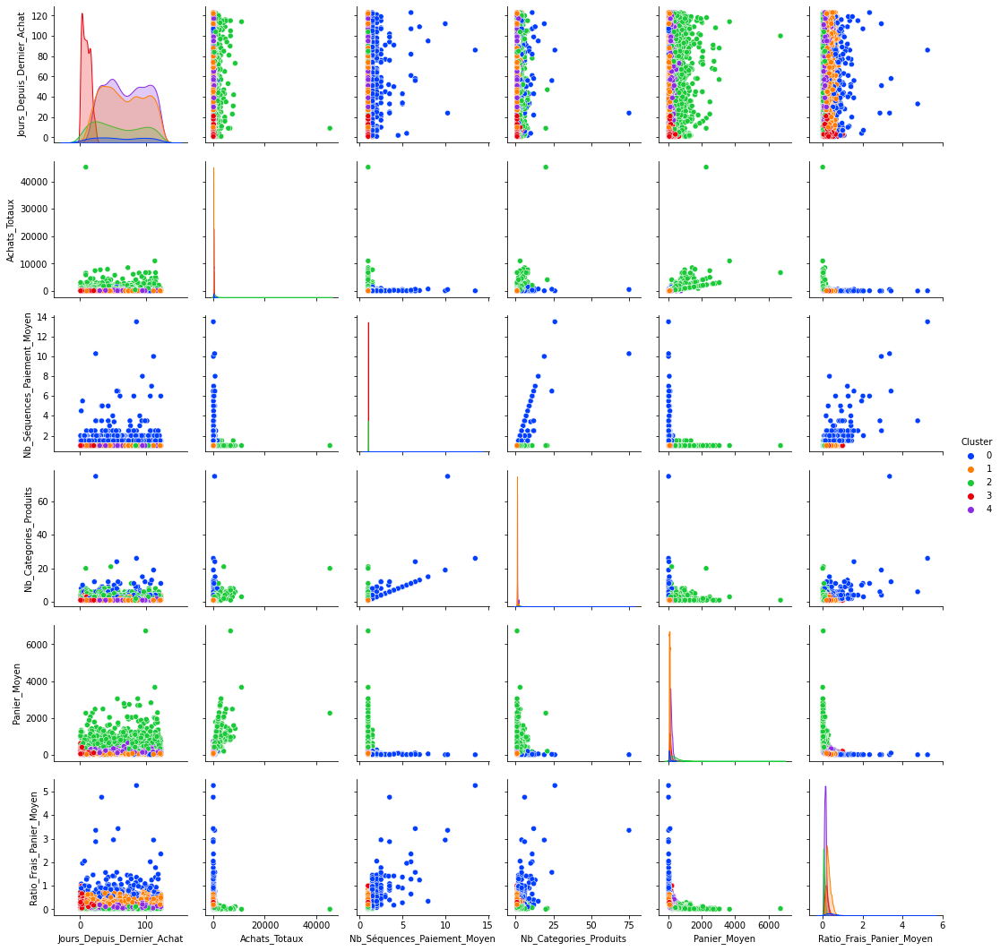

In [ ]:
sns.pairplot(df_3, hue='Cluster', palette='bright')

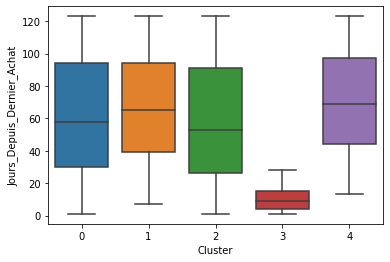

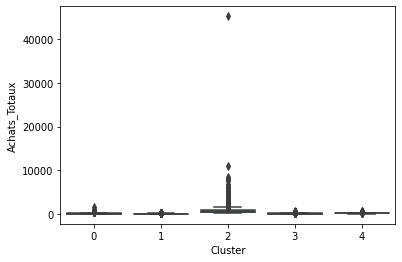

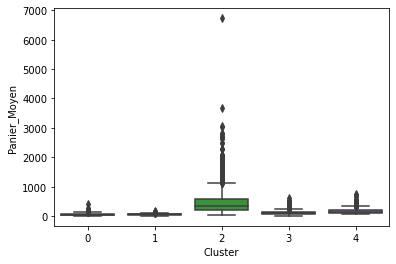

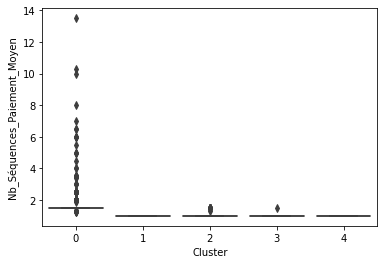

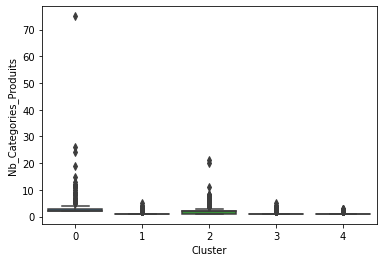

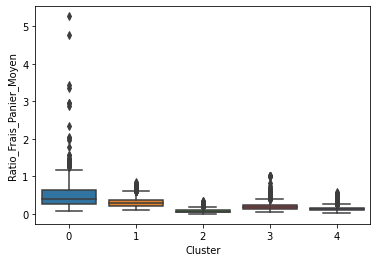

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_3)

In [ ]:
clustering(Scaled_Data_3, df_3, n_clusters=4)
sns.pairplot(df_3, hue='Cluster', palette='bright')

In [ ]:
# 4 clusters:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_3)

Période 4

In [ ]:
df_4.shape

(20956, 9)

In [ ]:
df_4.drop(columns=['Unnamed: 0', 'Periode'],
          inplace=True)
df_4.sample(5)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
19613,ef5fb95d74c688cb0b6d49e77b7449b8,37,249.80,1.0,1,249.800,0.055645
17724,d7bf7cfe09c3d0f40e1cabde2dc17fd4,6,29.77,1.0,1,179.245,0.168877
18747,e4923ae2c32e70e3c5a6e73a9fb872f2,76,698.13,1.0,3,232.710,0.075931
10770,83e62ab4d504cdf419c2b24114e7c923,96,262.07,1.0,1,262.070,0.084596
16639,ca9fc1afaa87b284072deec8439d93f0,17,86.73,1.0,1,86.730,0.204428


Transformation au log

In [ ]:
transformation_log(df_4)
Log_Tfd_Data_4 = Log_Tfd_Data

Standardisation

In [ ]:
calculate_standardisation(Log_Tfd_Data_4, df_4)
Scaled_Data_4 = Scaled_Data

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                    0.755272  ...                  1.327763
1                    0.102905  ...                 -0.898369
2                   -0.034304  ...                  1.217175
3                    0.941128  ...                  0.654179
4                   -0.988532  ...                  1.691126

[5 rows x 6 columns]


Clustering

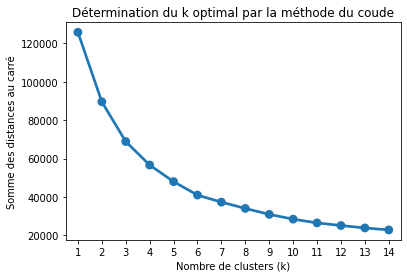

In [ ]:
range_k = range(1, 15)

calculate_KMeans(Scaled_Data_4, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.3171168774681645
Pour n_clusters = 3 , le silhouette_score moyen est : 0.3493534187340486
Pour n_clusters = 4 , le silhouette_score moyen est : 0.33267694939229897
Pour n_clusters = 5 , le silhouette_score moyen est : 0.32196212923610495
Pour n_clusters = 6 , le silhouette_score moyen est : 0.30519046148246876
Pour n_clusters = 7 , le silhouette_score moyen est : 0.31073077143713634
Pour n_clusters = 8 , le silhouette_score moyen est : 0.2690305637390602


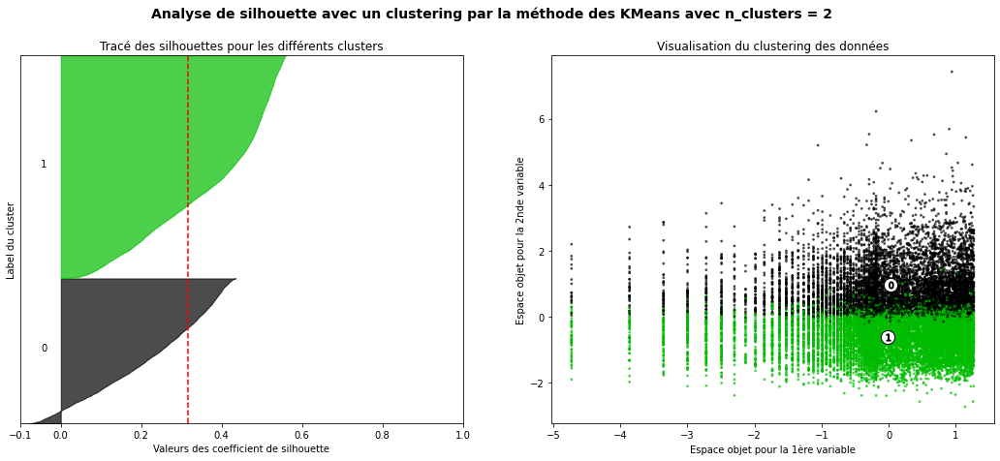

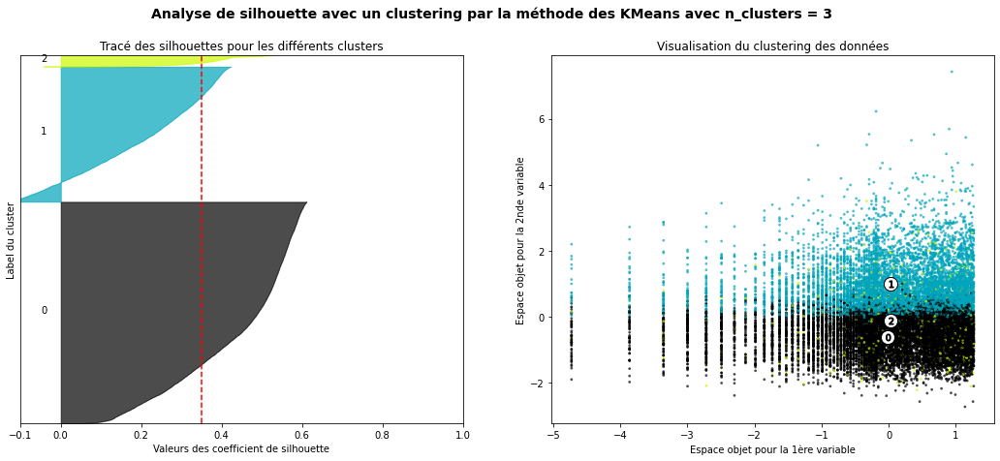

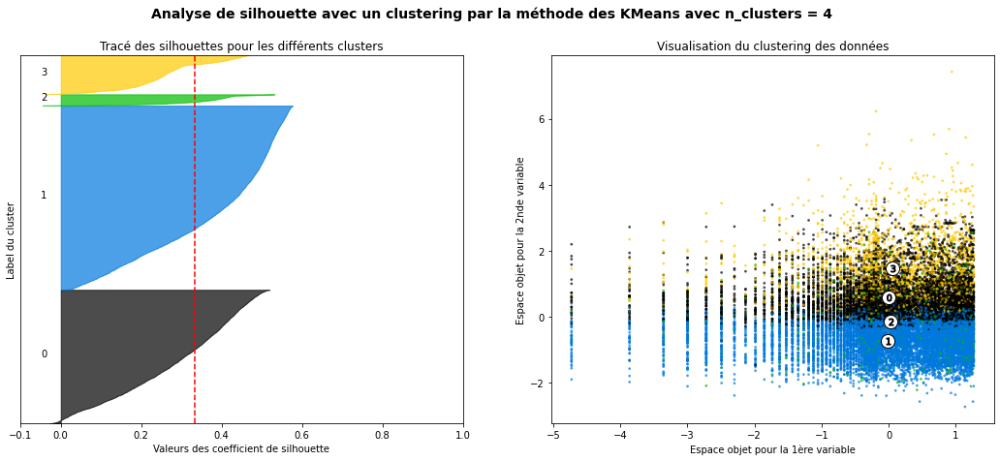

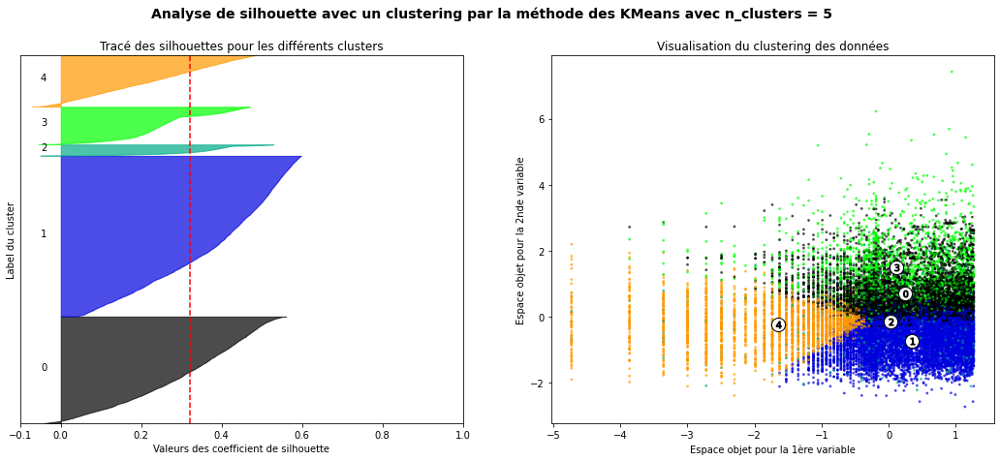

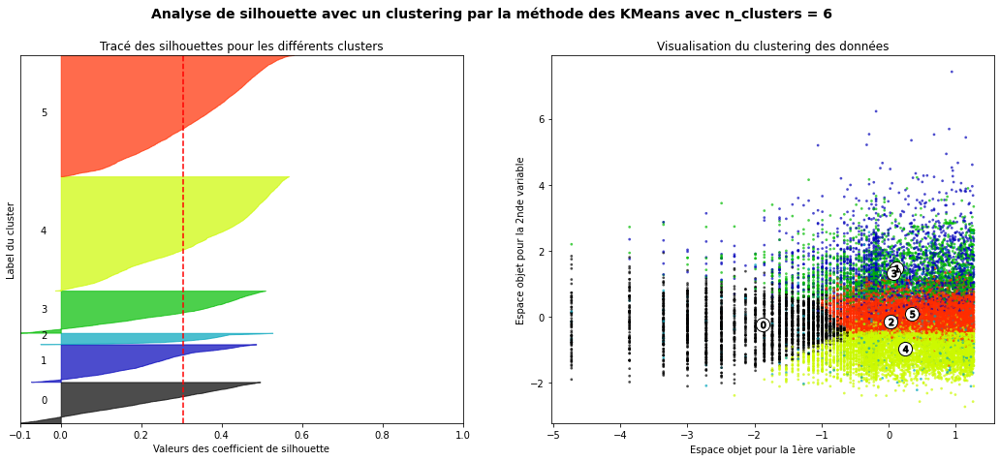

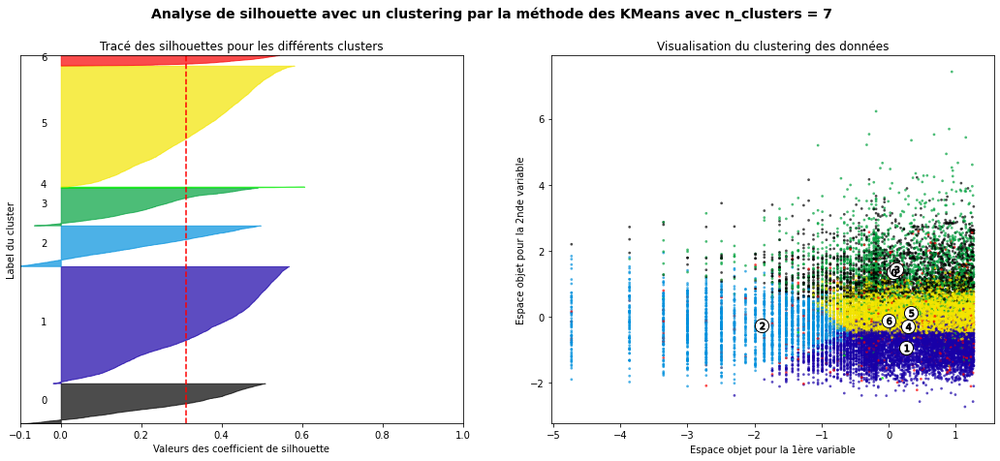

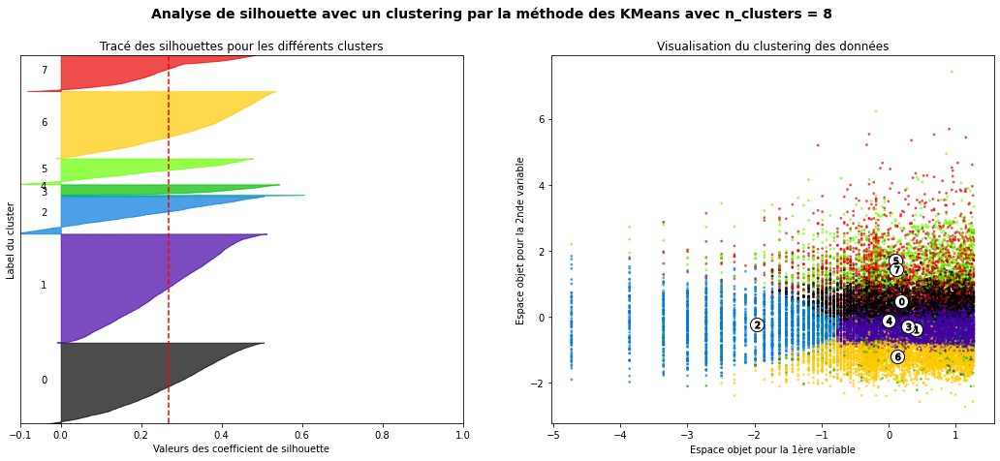

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

calculate_silhouette_score(range_n_clusters, Scaled_Data_4)

In [ ]:
clustering(Scaled_Data_4, df_4, n_clusters=5)
df_4.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0000f6ccb0745a6a4b88665a16c9f078,81,43.62,1.0,1,43.62,0.404172,0
1,0004aac84e0df4da2b147fca70cf8255,48,196.89,1.0,1,196.89,0.085784,1
2,00082cbe03e478190aadbea78542e933,43,126.26,1.0,1,126.26,0.374307,0
3,000bfa1d2f1a41876493be685390d6d3,94,93.70,1.0,2,46.85,0.252935,0
4,000c8bdb58a29e7115cfc257230fb21b,20,29.00,1.0,1,29.00,0.520690,0


Visualisation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


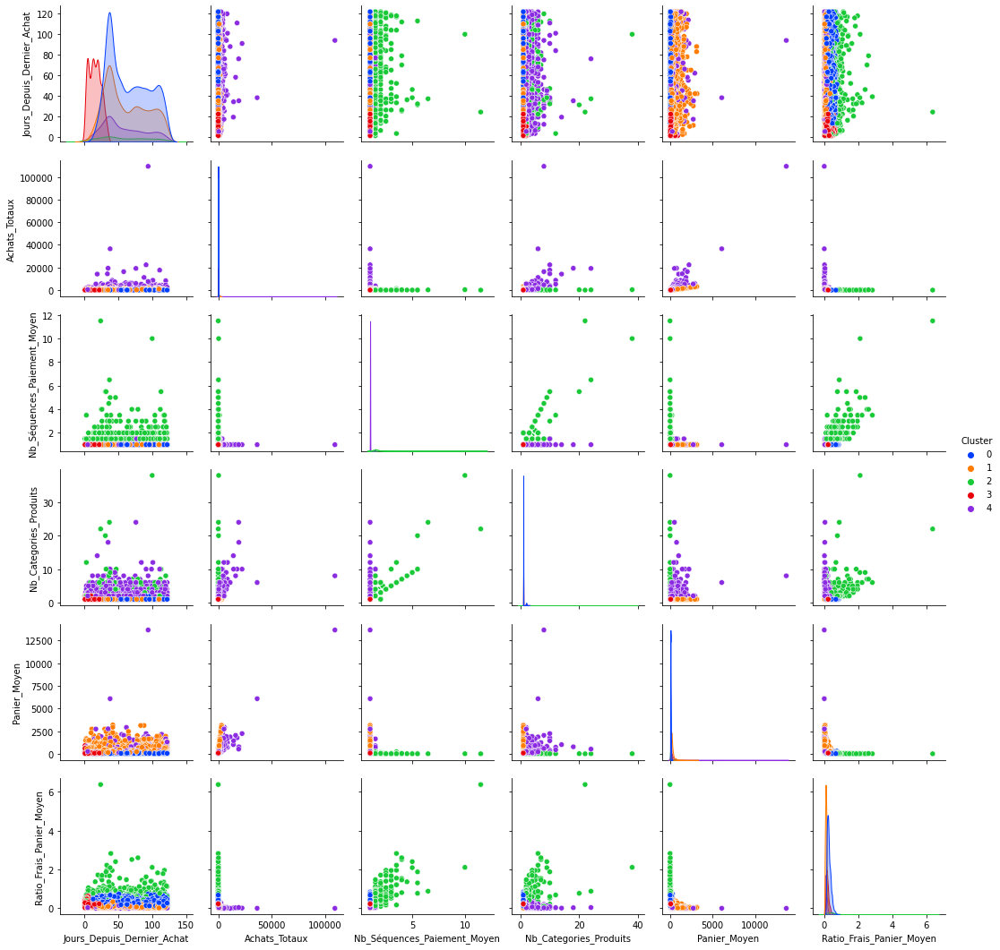

In [ ]:
sns.pairplot(df_4, hue='Cluster', palette='bright')

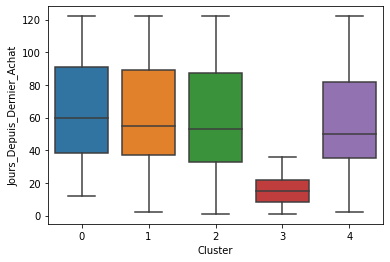

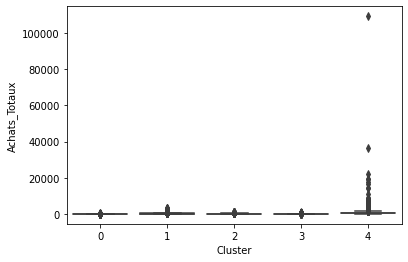

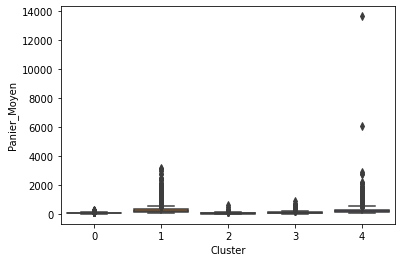

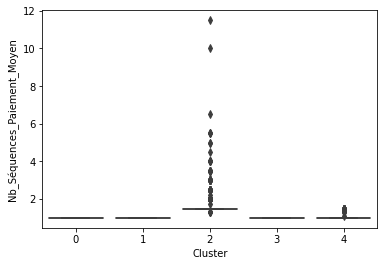

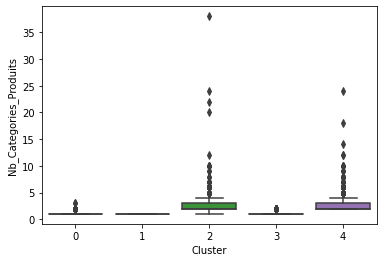

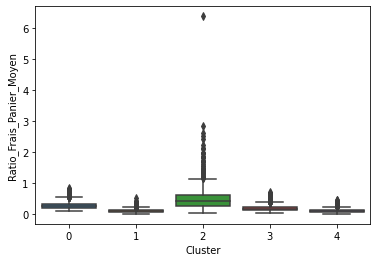

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_4)

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


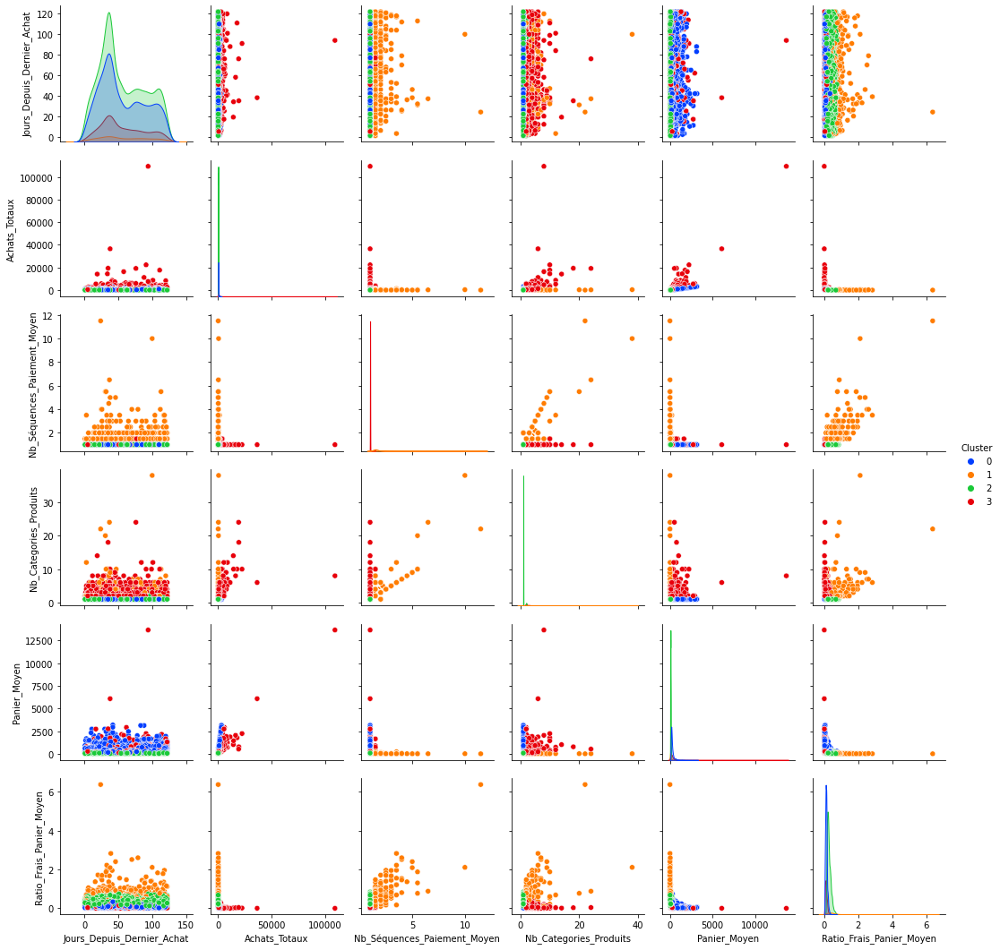

In [ ]:
clustering(Scaled_Data_4, df_4, n_clusters=4)
sns.pairplot(df_4, hue='Cluster', palette='bright')

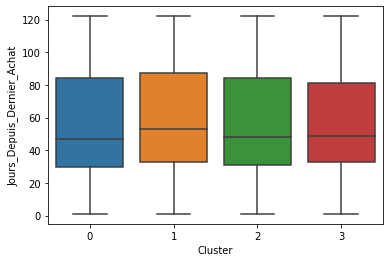

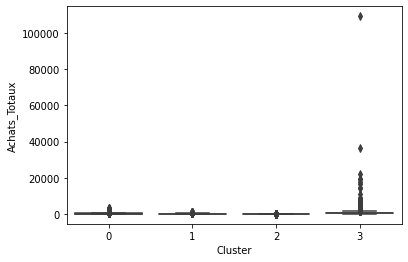

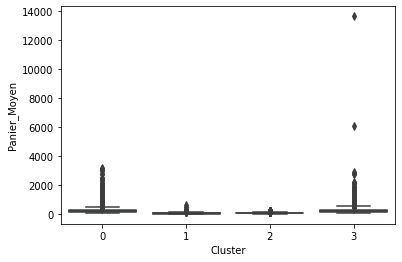

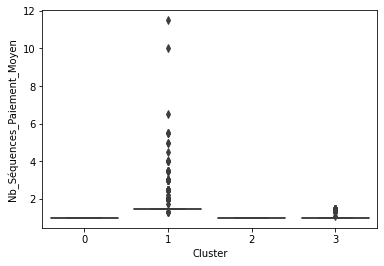

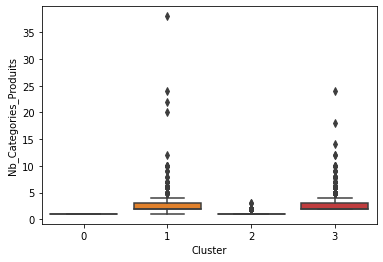

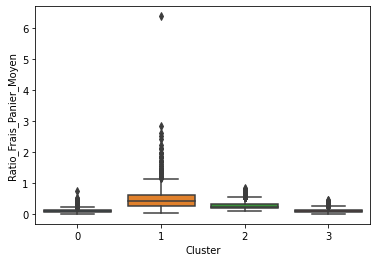

In [ ]:
# 4 clusters:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_4)

Période 5

In [ ]:
df_5.shape

(26861, 9)

In [ ]:
df_5.drop(columns=['Unnamed: 0', 'Periode'],
          inplace=True)
df_5.sample(5)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
5436,331dc230afcd2ee9910c68f1790a0582,111,147.15,1.0,1,147.15,0.123344
1861,117c2c5c0d42af6a560b0b09af20b196,33,216.64,1.0,1,216.64,0.075148
24488,e8f406ba92b9d938ac7a9fc67261bfb0,113,59.52,1.0,1,59.52,0.430612
17224,a387d752d46438289df416efcb368aef,40,236.96,1.0,1,236.96,0.060179
15358,91dc8b49c822679287e3c9ff321064a1,64,47.80,1.0,1,47.80,0.714435


Transformation au log

In [ ]:
transformation_log(df_5)
Log_Tfd_Data_5 = Log_Tfd_Data

Standardisation

In [ ]:
calculate_standardisation(Log_Tfd_Data_5, df_5)
Scaled_Data_5 = Scaled_Data

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                   -0.596234  ...                 -1.070439
1                   -1.523028  ...                  0.331495
2                    0.340259  ...                 -1.867896
3                    0.108561  ...                  0.209465
4                   -0.186720  ...                  0.375483

[5 rows x 6 columns]


Clustering

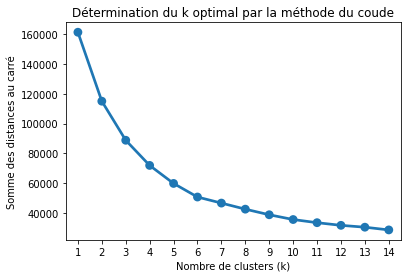

In [ ]:
range_k = range(1, 15)

calculate_KMeans(Scaled_Data_5, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.3115189290869274
Pour n_clusters = 3 , le silhouette_score moyen est : 0.3405373084015809
Pour n_clusters = 4 , le silhouette_score moyen est : 0.3405361398198045
Pour n_clusters = 5 , le silhouette_score moyen est : 0.35056153018854636
Pour n_clusters = 6 , le silhouette_score moyen est : 0.3308776651794277
Pour n_clusters = 7 , le silhouette_score moyen est : 0.3369648050705068
Pour n_clusters = 8 , le silhouette_score moyen est : 0.3369837548285882


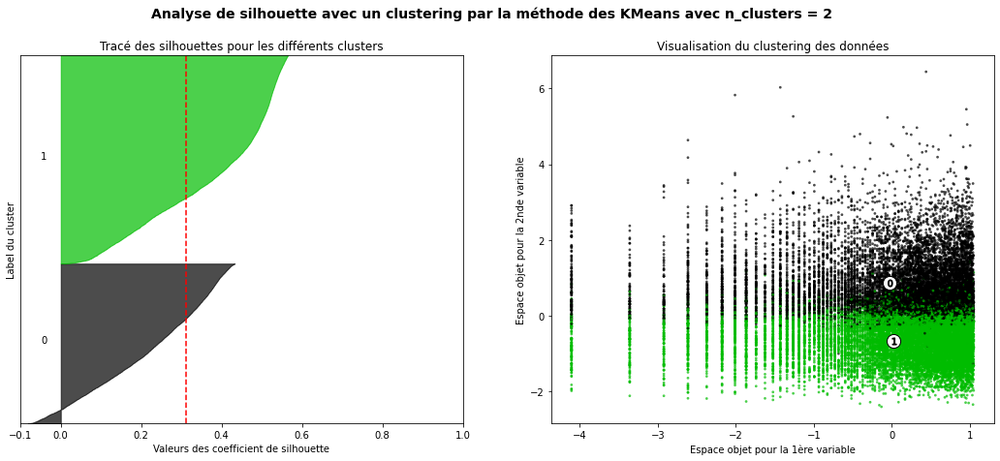

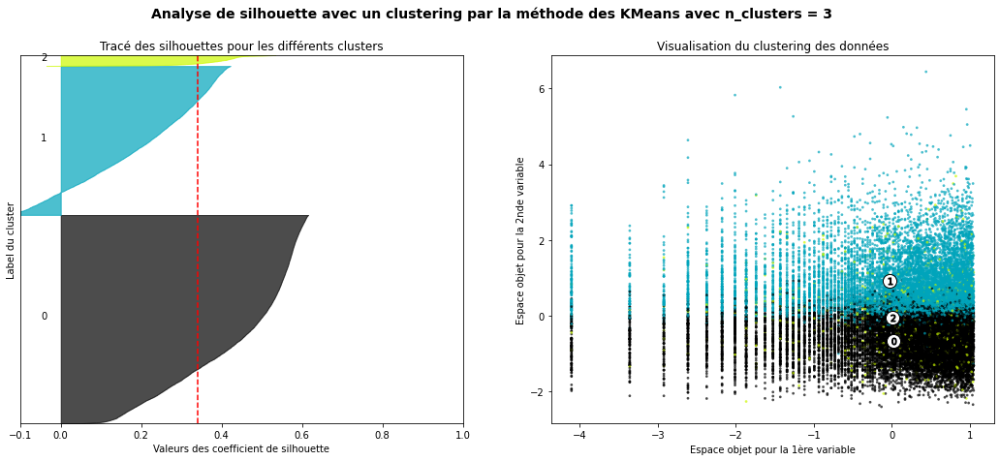

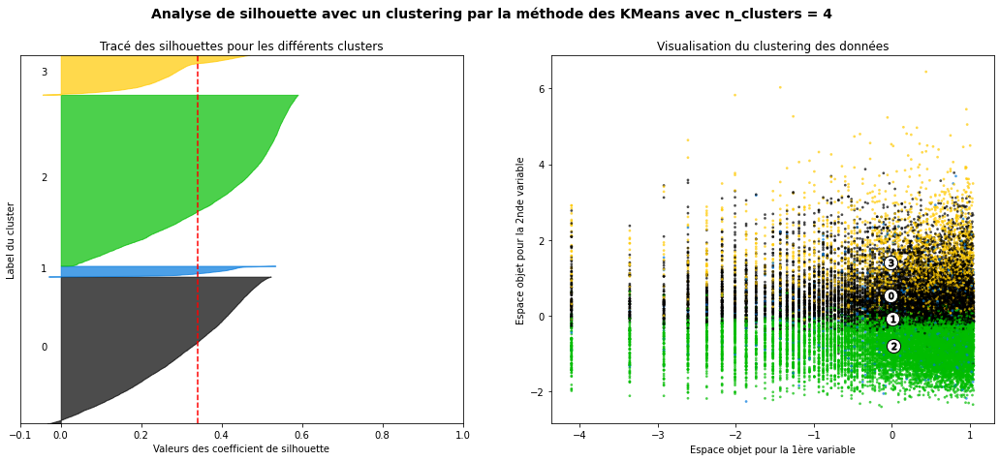

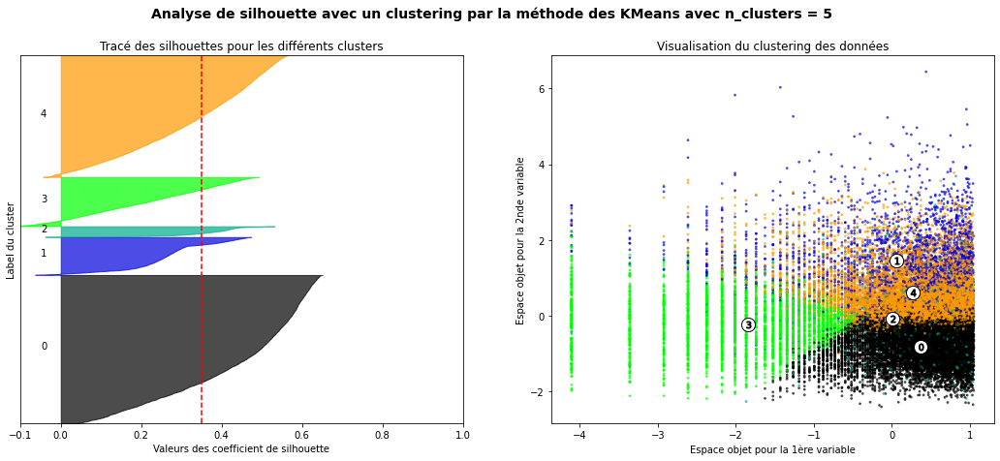

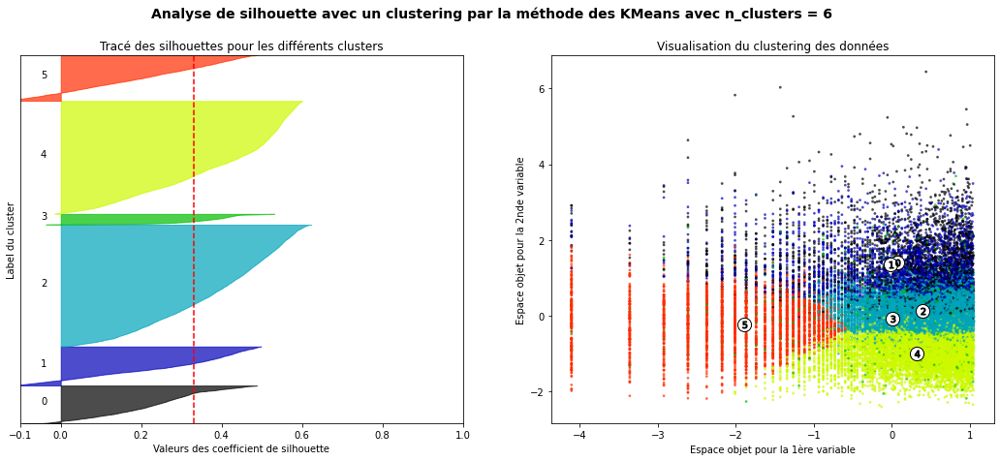

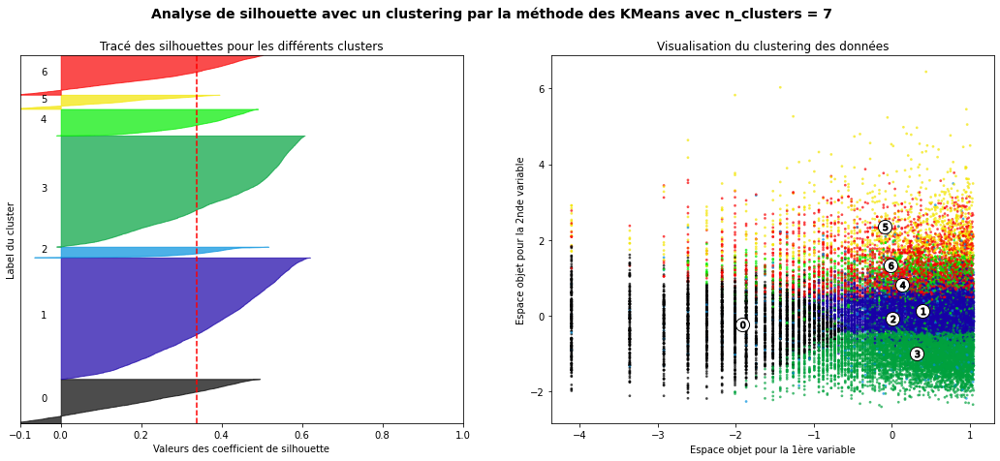

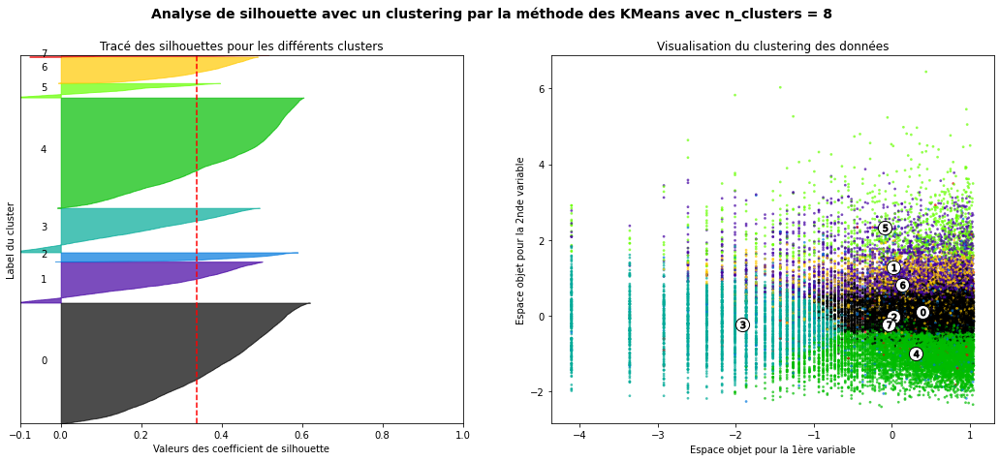

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

calculate_silhouette_score(range_n_clusters, Scaled_Data_5)

In [ ]:
clustering(Scaled_Data_5, df_5, n_clusters=5)
df_5.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0004bd2a26a76fe21f786e4fbd80607f,26,166.98,1.0,1,166.98,0.077734,1
1,00050ab1314c0e55a6ca13cf7181fecf,11,35.38,1.0,1,35.38,0.208875,3
2,00053a61a98854899e70ed204dd4bafe,62,838.36,1.0,2,419.18,0.044348,2
3,0005ef4cd20d2893f0d9fbd94d3c0d97,50,129.76,1.0,1,129.76,0.191584,1
4,00090324bbad0e9342388303bb71ba0a,38,63.66,1.0,1,63.66,0.215363,0


Visualisation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


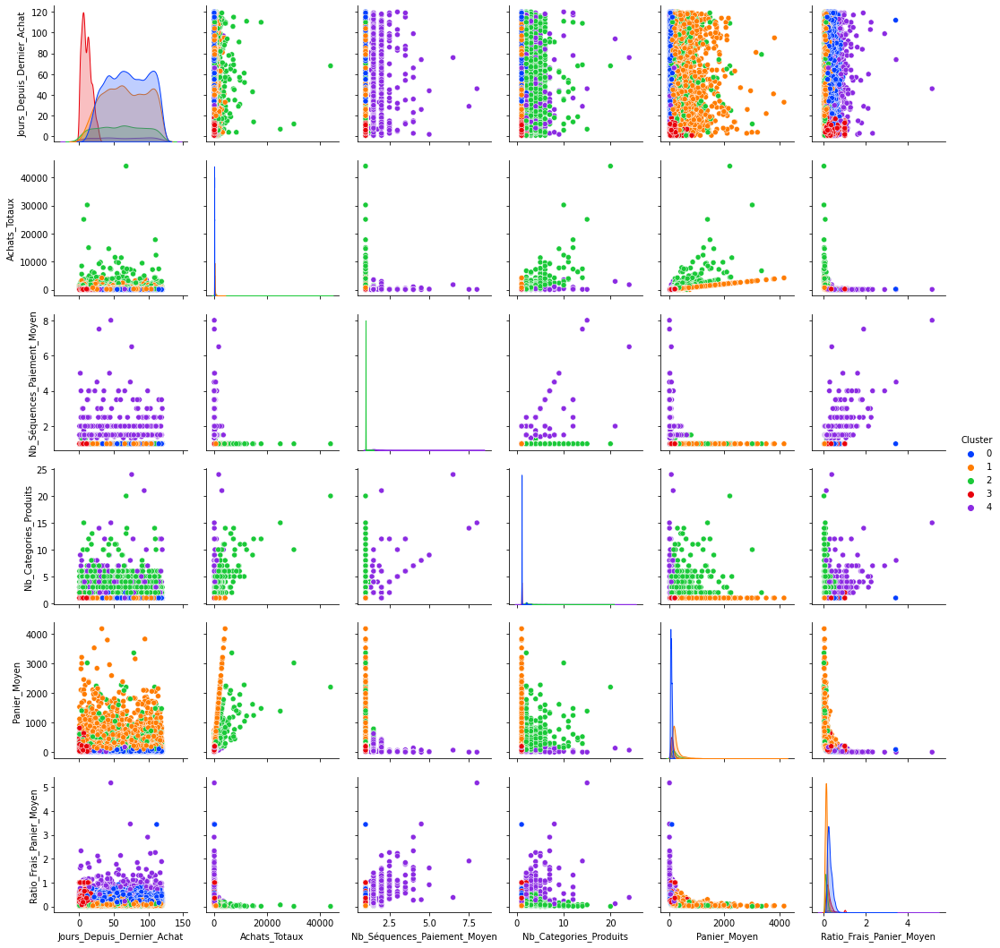

In [ ]:
sns.pairplot(df_5, hue='Cluster', palette='bright')

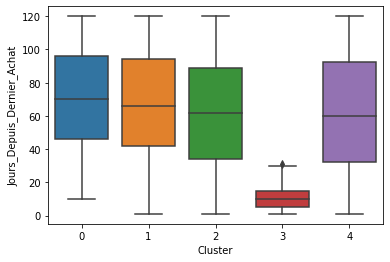

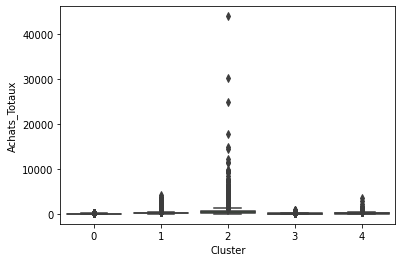

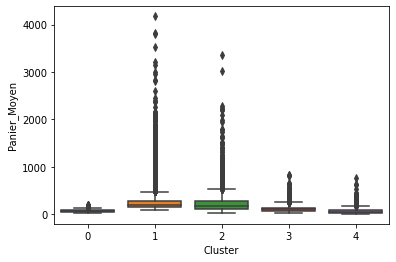

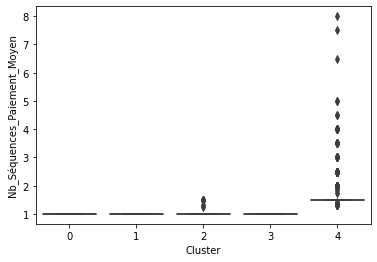

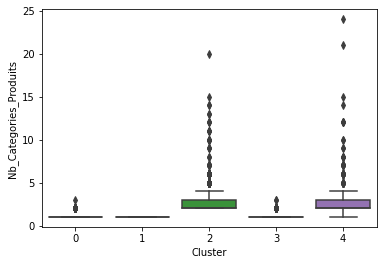

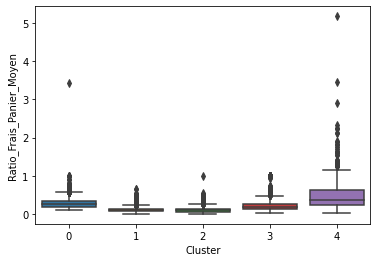

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_5)

Période 6

In [ ]:
df_6.shape

(25138, 9)

In [ ]:
df_6.drop(columns=['Unnamed: 0', 'Periode'],
          inplace=True)
df_6.sample(5)

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen
1732,11a195cba7e03b549d32abad6a9285ba,36,99.85,1.0,1,99.85,0.218828
13770,8cceda9d14b22d0c1821475bc85c685a,63,61.40,1.0,1,61.40,0.299674
11762,77f53c0376732a9104f22854c73987df,86,75.27,1.0,1,75.27,0.242859
5988,3d1909f3fcbd1a322ac9b0ab2e2e8f24,118,199.80,1.0,1,199.80,0.119169
12605,8032878a9fcb1e269a19befcc57ec8c3,70,199.43,1.0,1,199.43,0.448478


Transformation au log

In [ ]:
transformation_log(df_6)
Log_Tfd_Data_6 = Log_Tfd_Data

Standardisation

In [ ]:
calculate_standardisation(Log_Tfd_Data_6, df_6)
Scaled_Data_6 = Scaled_Data

   Jours_Depuis_Dernier_Achat  ...  Ratio_Frais_Panier_Moyen
0                    1.059521  ...                 -0.960382
1                    1.093421  ...                  0.834506
2                    0.396586  ...                  1.447736
3                   -2.105741  ...                  1.412734
4                    0.930199  ...                  1.141121

[5 rows x 6 columns]


Clustering

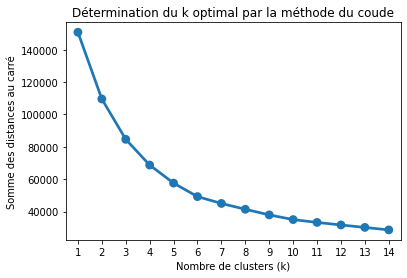

In [ ]:
range_k = range(1, 15)

calculate_KMeans(Scaled_Data_6, range_k, n_init=15)

Pour n_clusters = 2 , le silhouette_score moyen est : 0.2927923251191877
Pour n_clusters = 3 , le silhouette_score moyen est : 0.32189981186393063
Pour n_clusters = 4 , le silhouette_score moyen est : 0.31855398963656123
Pour n_clusters = 5 , le silhouette_score moyen est : 0.3066898724329488
Pour n_clusters = 6 , le silhouette_score moyen est : 0.3067082148341372
Pour n_clusters = 7 , le silhouette_score moyen est : 0.29740307341026506
Pour n_clusters = 8 , le silhouette_score moyen est : 0.3020306655152395


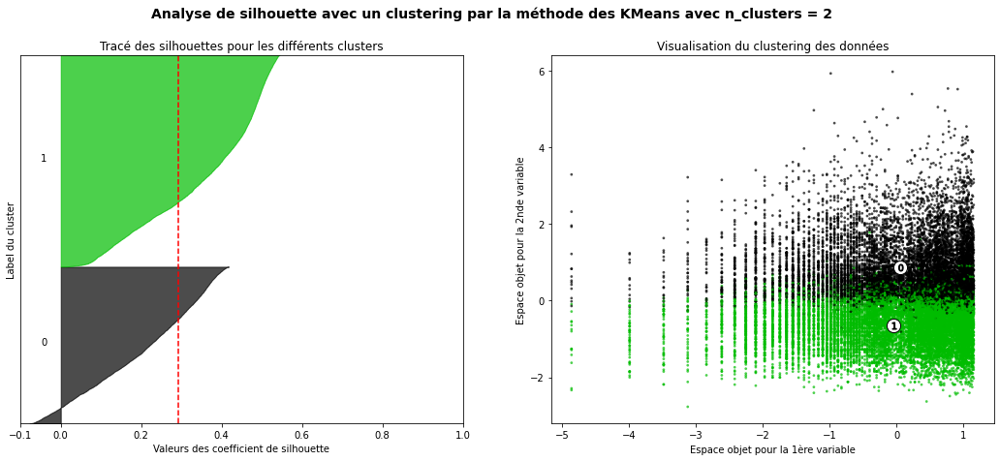

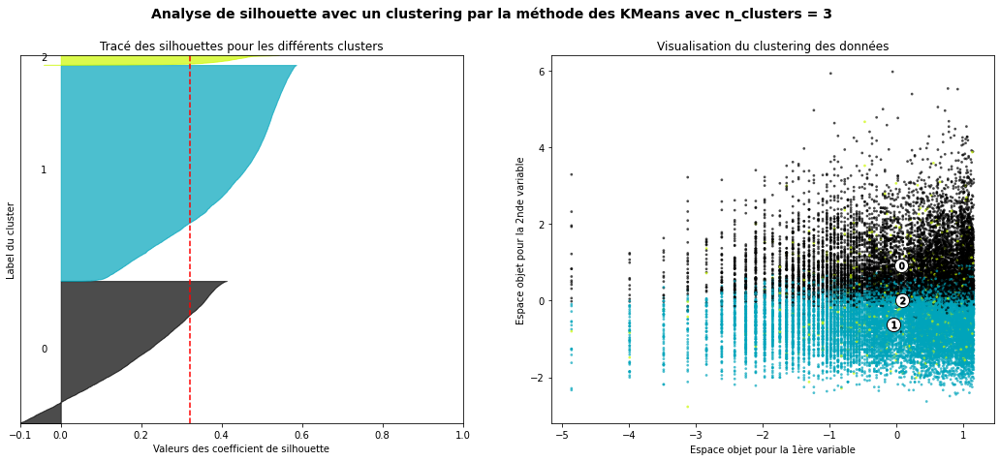

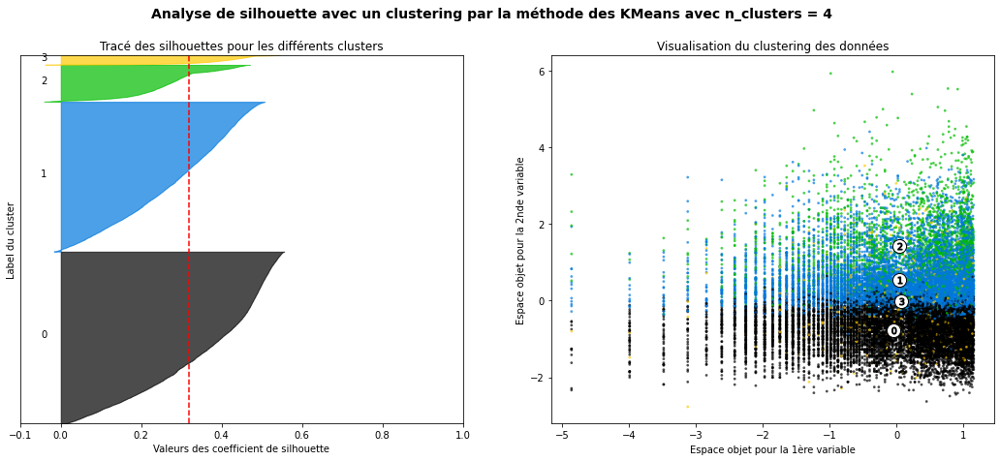

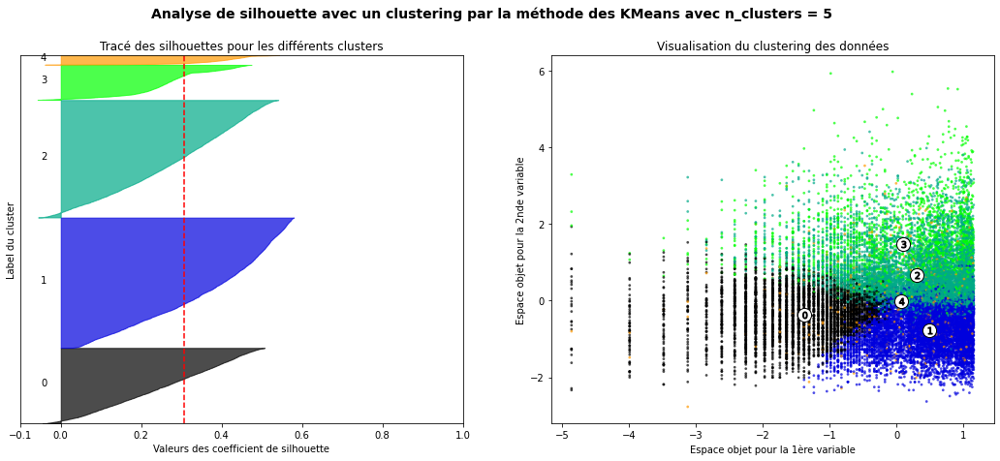

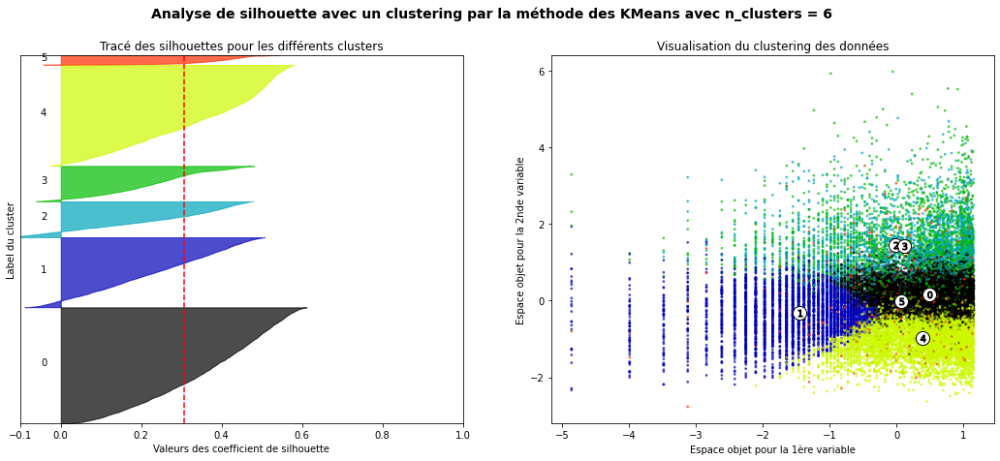

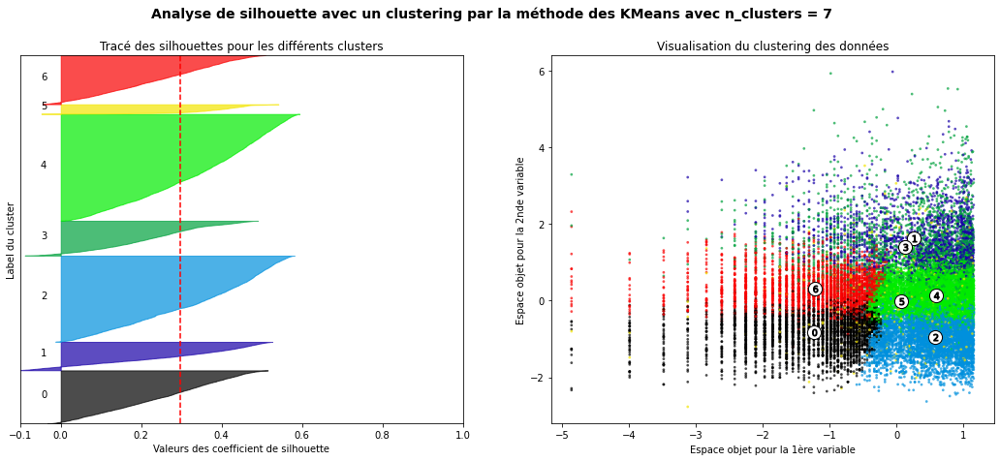

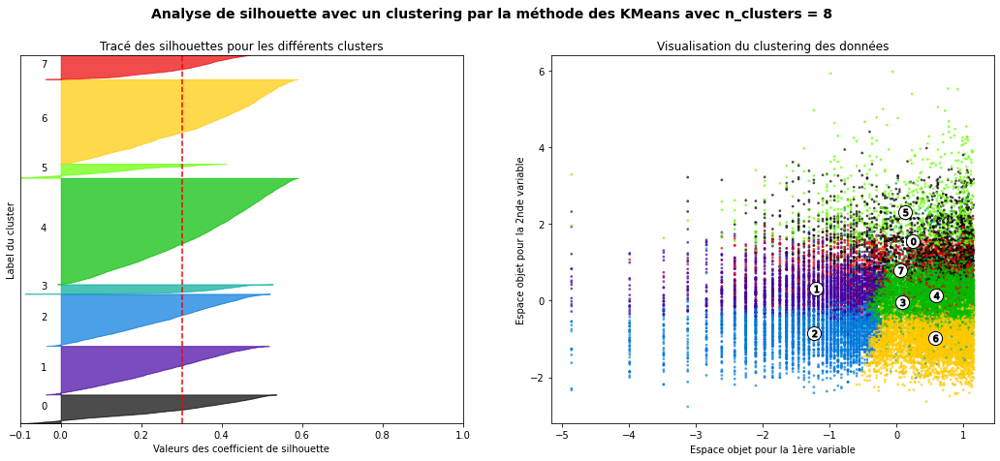

In [ ]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8]

calculate_silhouette_score(range_n_clusters, Scaled_Data_6)

In [ ]:
clustering(Scaled_Data_6, df_6, n_clusters=5)
df_6.head()

,ID_Client,Jours_Depuis_Dernier_Achat,Achats_Totaux,Nb_Séquences_Paiement_Moyen,Nb_Categories_Produits,Panier_Moyen,Ratio_Frais_Panier_Moyen,Cluster
0,0000366f3b9a7992bf8c76cfdf3221e2,112,141.90,1.0,1,141.90,0.084567,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,27.19,1.0,1,27.19,0.304892,1
2,000e309254ab1fc5ba99dd469d36bdb4,66,78.42,1.5,2,39.21,0.472328,3
3,000ec5bff359e1c0ad76a81a45cb598f,9,27.75,1.0,1,27.75,0.460901,0
4,000ed48ceeb6f4bf8ad021a10a3c7b43,101,20.75,1.0,1,20.75,0.379277,1


Visualisation

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:305: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)


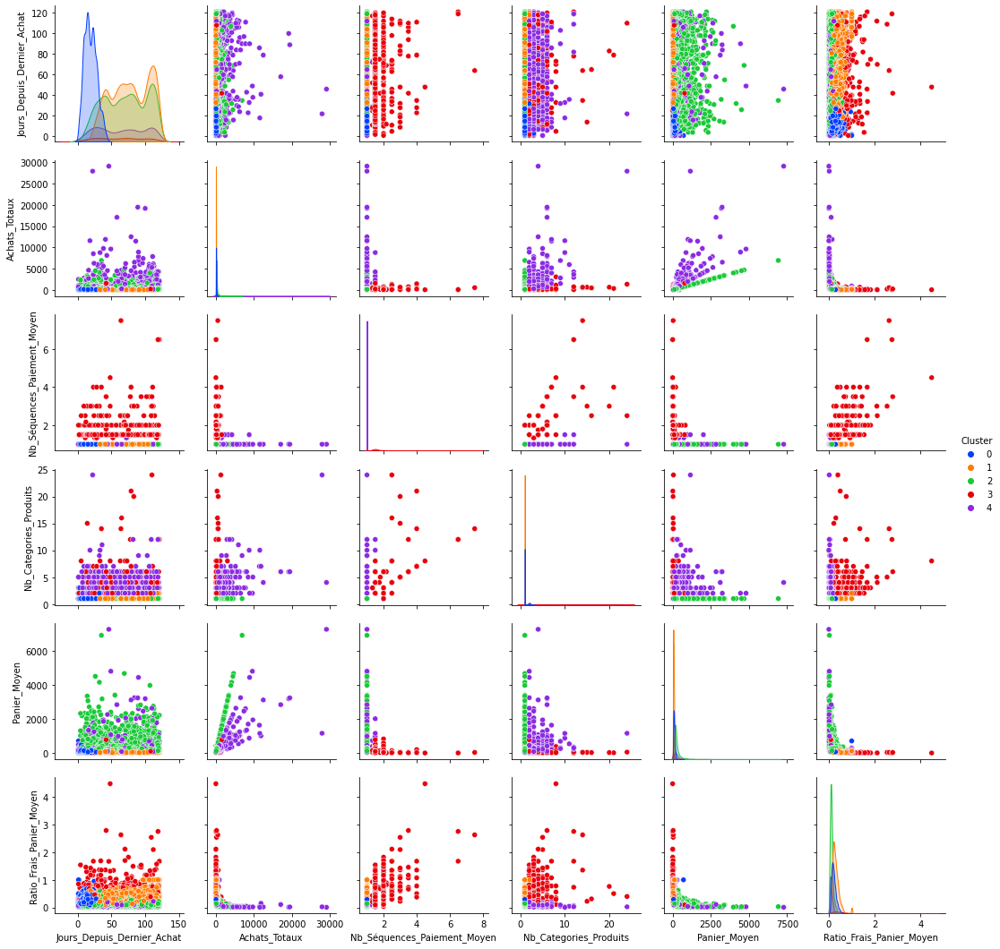

In [ ]:
sns.pairplot(df_6, hue='Cluster', palette='bright')

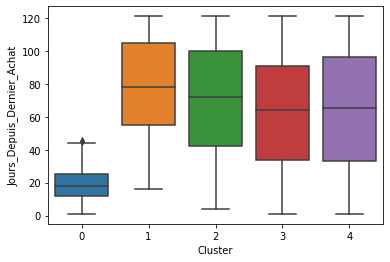

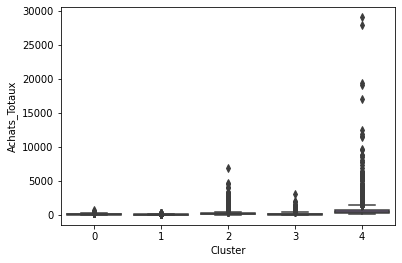

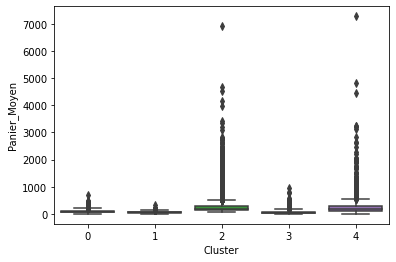

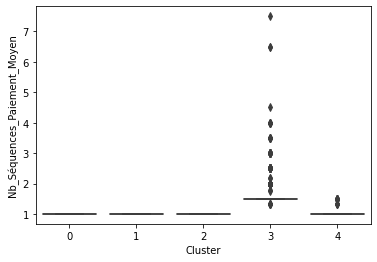

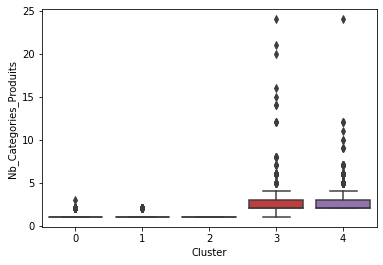

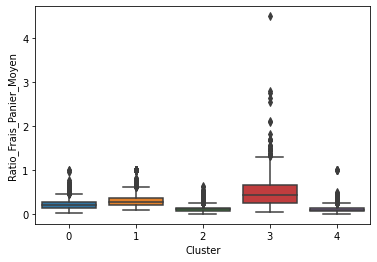

In [ ]:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_6)

In [ ]:
clustering(Scaled_Data_6, df_6, n_clusters=4)
sns.pairplot(df_6, hue='Cluster', palette='bright')

In [ ]:
# 4 clusters:
for var in list_variables:
    plt.figure()
    sns.boxplot(x='Cluster', y=var, data=df_6)
    